In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.path.dirname('__file__'), '/home/kduplat/Documents/Data/Pscript2/Fct_scripts')))
from Tools import *

color_list = ['#0072b2', '#009e73', '#e69f00', '#d55e00','#f0e442',
              '#cc79a7', '#56b4e9', '#000000']

import cv2
from matplotlib.path import Path
from skimage.filters import threshold_multiotsu, threshold_otsu
from skimage import filters, measure
from scipy.ndimage.morphology import binary_closing
from scipy.ndimage import label

/tmp/ipykernel_3174010/1055253456.py:13: DeprecationWarning: Please use `binary_closing` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import binary_closing


#   Otsu

In [2]:
def class_contrast(image, thresholds):
    regions = np.digitize(image, bins=thresholds)
    means = [np.mean(image[regions == i]) for i in range(len(thresholds) + 1)]
    contrast = np.std(means)  # Dispersion des moyennes
    return contrast

def otsu_criterion(image, thresholds):
    """
    Calcule la variance intra-classe totale après seuillage multi-Otsu.
    Plus cette valeur est faible, meilleure est la séparation des classes.
    """
    regions = np.digitize(image, bins=thresholds)
    total_variance = 0
    
    for i in range(len(thresholds) + 1):
        mask = regions == i
        if np.any(mask):
            variance = np.var(image[mask])
            total_variance += variance
    
    return total_variance


from matplotlib.path import Path
def otsu_detection(nbclasse, image, m_size, sigma_X, sigma_Y, mode_switch, min_nbclass = 2):
    max_interclasse = 0
    min_intraclasse = 1e12
    max_nbclasse = 0
    
    """ blurred_image = cv2.GaussianBlur(image, (m_size, m_size), sigmaX = sigma_X, sigmaY = sigma_Y) """
    blurred_image  = cv2.medianBlur(image, 5)
    
    #Find the best number of classes
    for n in range(min_nbclass, nbclasse + 1):
        thresholds = threshold_multiotsu(blurred_image[image!=0], classes = n)
        if mode_switch == 0:
            contrast = class_contrast(image, thresholds)
            if contrast > max_interclasse:
                max_interclasse = contrast
                max_nbclasse = n
                
        elif mode_switch == 1:
            intra_std = otsu_criterion(image, thresholds)
            if intra_std < min_intraclasse:
                min_intraclasse = intra_std
                max_nbclasse = n
        else:
            raise ValueError("otsu_detection mode_switch must be 0 or 1")
    # max_nbclasse = 5
    return cluster_detection(blurred_image, max_nbclasse)

def contours_to_label_fct(labeled_image, contours, num_features):
    L1 = labeled_image.shape[0]
    L2 = labeled_image.shape[1]
    ##########External contour##########
    contour_to_label = []
    for j, contour in enumerate(contours):  
        external_path = Path(contour)
        for k in range(1,num_features + 1):
            patch = np.argwhere(labeled_image == k)
            inside = external_path.contains_points(patch)
            if np.any(inside): #Au moins un élément dans être contenu dans le contour
                contour_to_label.append([j, k])
                # ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="red", alpha=1)
                break
        else: 
            contour_to_label.append([j, -1]) #Si aucun élément n'est contenu dans le contour, c'est un contour interieur    
            # ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="blue", alpha=1)  

    ##########Internal contour##########
    contour_to_label = np.array(contour_to_label)
    mask = contour_to_label[:,1] == -1

    for _, int_id_contour in enumerate(contour_to_label[mask][:,0]):
        for _, (id_contour, idpatch) in enumerate(contour_to_label[~mask]):
            external_path = Path(contours[id_contour])
            inside = external_path.contains_points(contours[int_id_contour])
            if np.any(inside): #Au moins un élément dans être contenu dans le contour
                contour_to_label[int_id_contour,1] = idpatch 
                # ax.plot(contours[int_id_contour][:, 1], contours[int_id_contour][:, 0], linewidth=2, color="green", alpha=1)
                break
        else:
            for point in contours[int_id_contour]:
                y, x = np.floor(point).astype(int)

                neighbors = [(y+1, x), (y-1, x), (y, x+1), (y, x-1)]
                for y_neighbor, x_neighbor in neighbors: 
                    if 0 <= x_neighbor < L1 and 0 <= y_neighbor < L2:
                        label_val = labeled_image[y_neighbor, x_neighbor]
                        if label_val:
                            contour_to_label[int_id_contour, 1] = label_val
                            break

                    
        if contour_to_label[int_id_contour,1] == -1:
            print("A contour is not linked to a cluster, id_contour = {}".format(int_id_contour))
        """     ax.plot(contours[int_id_contour][:, 1], contours[int_id_contour][:, 0], linewidth=3, color="orange", alpha=1)
        else :
            ax.plot(contours[int_id_contour][:, 1], contours[int_id_contour][:, 0], linewidth=3, color="green", alpha=1) """
    
    #Change the contour_id to the patch_id since it will be the same in all_contours_to_label and all_contours 
    return contour_to_label


def cluster_detection(blurred_image, nbclass):
    feature_areas = []
    all_contours = []
    all_labeled_image = []
    
    thresholds = threshold_multiotsu(blurred_image[blurred_image!=0], classes = nbclass)#Find the thresholds
    regions = np.digitize(blurred_image, bins=thresholds)
    all_contours_to_label = []
    
    for i in range (0, nbclass):
        # print(i)
        mask = regions == i  # Tolérance pour ignorer uniquement les valeurs très faibles
        masked_image = np.where(mask, 1, -1)

        smoothed_image = filters.gaussian(masked_image, sigma=1) #Allow to fill the possible holes in the clusters
        
        original = smoothed_image
        thres = threshold_otsu(smoothed_image) #Find a threshold between background and the class
        binary = original > thres

        binary_closed = binary_closing(binary, structure=np.ones((2,2))) #Créé les domaines (dilatation + erosion)
        labeled_image, num_features = label(binary_closed)  #Etiquettes les regions 
        feature_areas.extend(np.bincount(labeled_image.ravel())[1:]) #Enregistre la taille de chaque regions (ravel aplati le tableau)
        all_labeled_image.append(labeled_image)

        contours = measure.find_contours(binary_closed, level=0.5)
        all_contours.extend(contours)
    
        ##########Link contours to labeled clusters##########

        contours_to_label = contours_to_label_fct(labeled_image, contours, num_features)
        contours_to_label[:,0] = i
        all_contours_to_label.extend(contours_to_label)  
    
    return np.array(feature_areas), np.array(all_contours, dtype = object), np.array(all_labeled_image), thresholds, np.array(all_contours_to_label)
           
                


In [ ]:
# Tnbclass =   [5, 5, 5, 5, 5, 4]
# Tmsize =     [3, 3, 3, 3, 5, 3]
# Tsigma_X =   [0, 0, 0, 0, 3, 2]
# Tcriterion = [1, 1, 1, 0, 1, 0] # 1: Interclass, 0: Intraclass

L2 = 256
L1 = 256
nu = 0.6

nbclass = 4
msize = 3
sigma = 2
mode = 0

file = "/data1/DATA_Duplat/Brut/Ava_track/Av6n7/Snapshots/nav79950402_outputB.txt"

data = np.loadtxt(file, comments='#')
sys = data.reshape(L1, L2).T
sys_image_bis = (sys * 255).astype(np.uint8)  # Conversion en échelle de 0 à 255 pour OpenCV

bins = np.logspace(np.log(1),np.log(L1*L2), 20)

nbpatches = []
#blurred_sys = cv2.GaussianBlur(sys_image_bis, (msize, msize), sigmaX = sigma, sigmaY = sigma)

total_var  = 0
nvar = 0

feature_areas, all_contours, all_labeled_image, thresholds, contour_to_label = otsu_detection(nbclass, sys_image_bis, msize, sigma, sigma, mode)

if len(all_contours) > 600 and nu < 0.5:
    blurred_sys2 = cv2.medianBlur(sys_image_bis, 5) #Supprime le bruit en raplaçant la valeur par la dmedian des voisines
        
    feature_areas, all_contours, all_labeled_image, thresholds, contour_to_label = otsu_detection(nbclass, blurred_sys2, 7,0,0, mode)
    


        
        


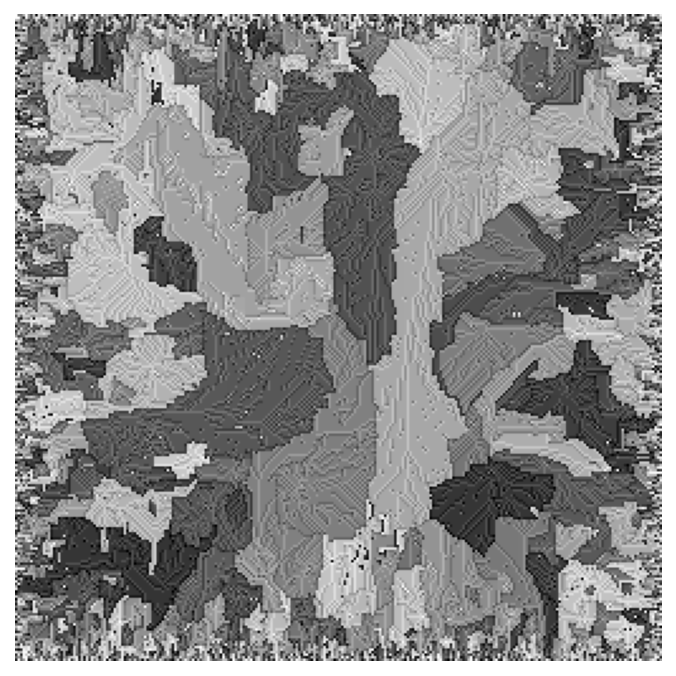

In [18]:
with plt.style.context(spstyle.get_style('thesis')):
    plt.rcParams['font.family'] = 'Arial' 
    
    fig, ax = plt.subplots(1,1,figsize = (3.5,2.8))
    
    ax.imshow(sys_image_bis, cmap='binary')
    ax.axis('off')
    fig.patch.set_alpha(0.0)
    # plt.savefig("Snap_detection_otsu_error.pdf", dpi = 600)
    plt.show()

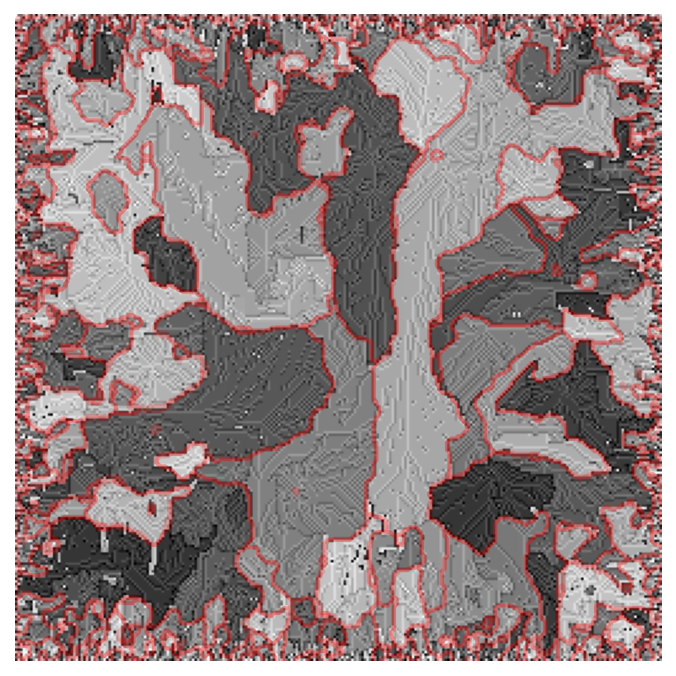

In [5]:
with plt.style.context(spstyle.get_style('thesis')):
    plt.rcParams['font.family'] = 'Arial' 
    
    fig, ax = plt.subplots(1,1,figsize = (3.5,2.8))
    
    ax.imshow(sys_image_bis, cmap='binary')
    for j, contour in enumerate(all_contours):
            ax.plot(contour[:, 1], contour[:, 0], color="red", alpha=0.2)
    ax.axis('off')
    fig.patch.set_alpha(0.0)
    # plt.savefig("Snap_detection_otsu_error.pdf", dpi = 600)
    plt.show()

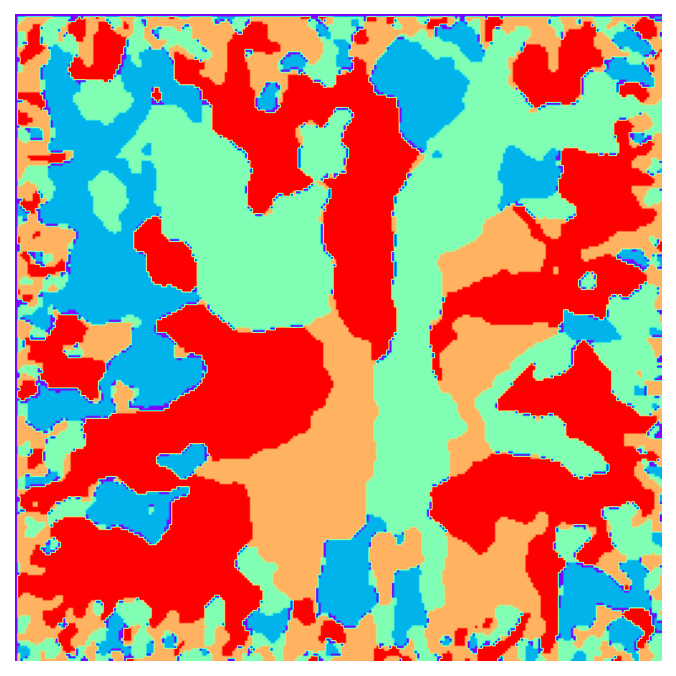

In [17]:
with plt.style.context(spstyle.get_style('thesis')):
    plt.rcParams['font.family'] = 'Arial' 
    
    fig, ax = plt.subplots(1,1,figsize = (3.5,2.8))
    sys_clustered = np.zeros((L1,L2))
    for i, labeled_image in enumerate(all_labeled_image):
        mask = labeled_image != 0
        sys_clustered[mask] = i+1
       
    # for j, contour in enumerate(all_contours):
    #         ax.plot(contour[:, 1], contour[:, 0], color="red", alpha=0.2)
    ax.imshow(sys_clustered, cmap='rainbow')
    ax.axis('off')
    fig.patch.set_alpha(0.0)
    # plt.savefig("Snap_detection_otsu_error.pdf", dpi = 600)
    plt.show()

#   Structure interne

In [24]:
import scipy.ndimage

In [20]:
data = np.loadtxt("/data1/DATA_Duplat/Brut/Ava_track/Av6n1/Snapshots/nav874_outputB.txt", comments = '#')
L1 =256
L2 =256
system = (1-data).reshape(L1, L2).T

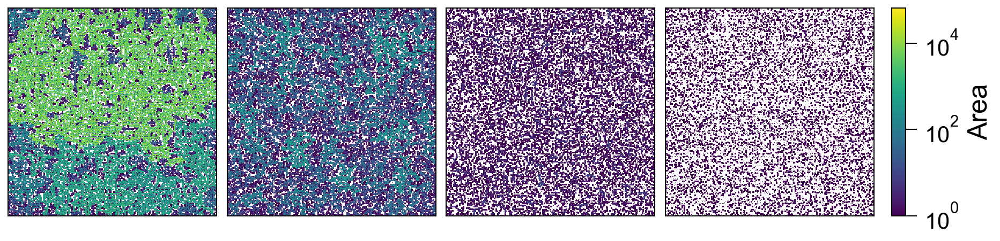

In [28]:
from matplotlib.colors import ListedColormap, LogNorm

with plt.style.context(spstyle.get_style('thesis')):

    # Créer une colormap personnalisée avec le blanc pour les valeurs nulles
    colors = [plt.cm.viridis(i) for i in range(0, 256)]
    custom_cmap = ListedColormap(colors)
    norm = LogNorm(vmin=1, vmax=L1*L2)
    
    # fig, axis = plt.subplots(2, 2, figsize=(7.2, 5.6))
    fig, axis = plt.subplots(1, 4, figsize=(7.2, 3.5))
    fig.subplots_adjust(hspace = 0.05, wspace = 0.05)
    axis = axis.flatten()

    matrix = np.ones((3, 3), dtype=int)
    
    
    mask = (0.8 <= system)
    lw, num = scipy.ndimage.label(mask, structure=matrix)
    area = scipy.ndimage.sum(mask, lw, index=arange(lw.max() + 1))
    areaImg = area[lw]
    areaImg[~mask] = 0
    pos1 = axis[0].imshow(areaImg, norm=norm, cmap=custom_cmap)

    
    mask = ((0.5 <= system) & (system <= 0.8))
    lw, num = scipy.ndimage.label(mask, structure=matrix)
    area = scipy.ndimage.sum(mask, lw, index=arange(lw.max() + 1))
    areaImg = area[lw]
    areaImg[~mask] = 0
    pos2 = axis[1].imshow(areaImg, norm=norm, cmap=custom_cmap)

    mask = ((0.2 <= system) & (system <= 0.5))
    lw, num = scipy.ndimage.label(mask, structure=matrix)
    area = scipy.ndimage.sum(mask, lw, index=arange(lw.max() + 1))
    areaImg = area[lw]
    areaImg[~mask] = 0
    pos3 = axis[2].imshow(areaImg, norm=norm, cmap=custom_cmap)

    mask = system <= 0.2
    lw, num = scipy.ndimage.label(mask, structure=matrix)
    b = arange(lw.max() + 1)
    area = scipy.ndimage.sum(mask, lw, index=arange(lw.max() + 1))
    areaImg = area[lw]
    areaImg[~mask] = 0
    pos4 = axis[3].imshow(areaImg, norm=norm, cmap=custom_cmap)

    # Ajouter une seule colorbar pour toute la figure avec échelle logarithmique
    cbar = fig.colorbar(pos4, ax=axis, norm=norm, fraction=0.0155, aspect = 15, pad = 0.02)
    # cbar = fig.colorbar(pos4, ax=axis, norm=norm, aspect = 25)
    cbar.set_label('Area')

    for ax in axis:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.spines['top'].set_visible(True)
        ax.spines['right'].set_visible(True)

    plt.show()


##  Cas démocratique

In [75]:
data = np.loadtxt("/data1/DATA_Duplat/Brut/Rdtopple/Rd8n1/Snapshots/nav100000000_outputB.txt", comments = '#')
L1 =256
L2 =256
system = (1-data).reshape(L1, L2).T

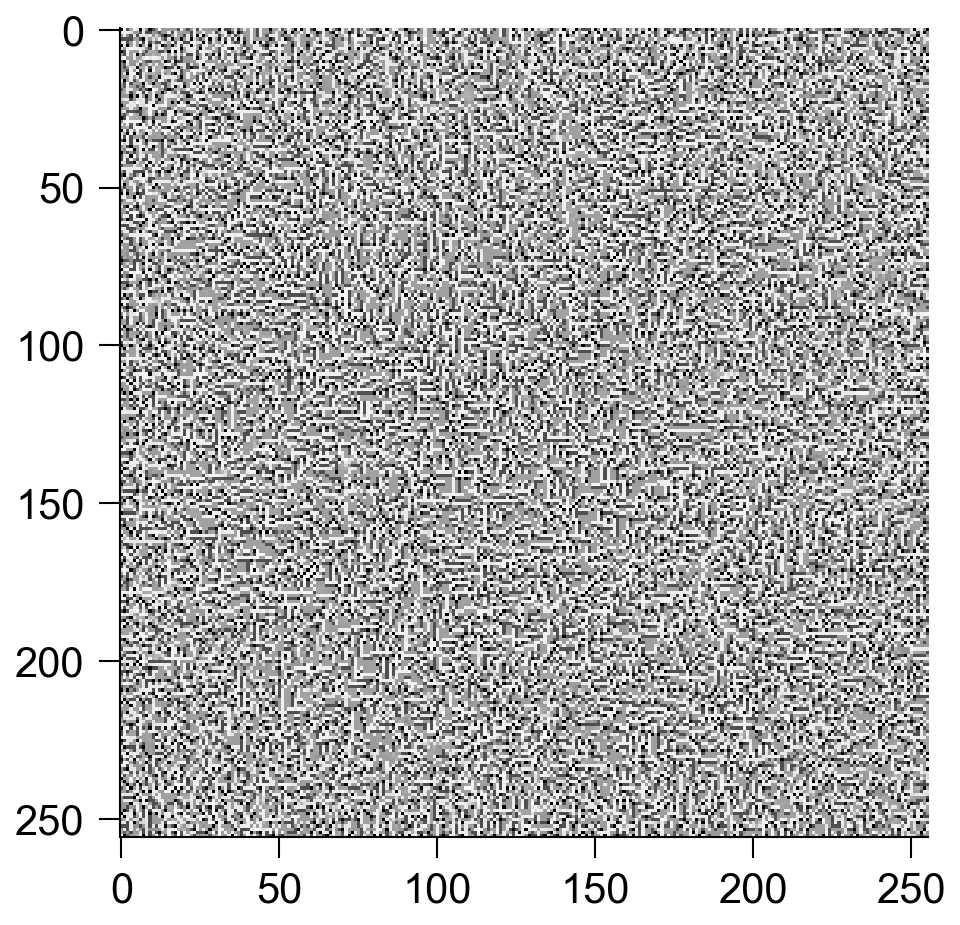

In [77]:
with plt.style.context(spstyle.get_style('thesis')):
    fig, ax = plt.subplots(1, 1, figsize=(4.2, 3.5))
    ax.imshow(system, cmap = "gray")
    plt.show()

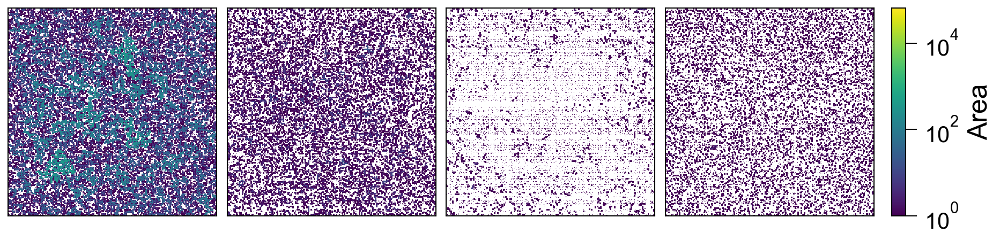

In [78]:
from matplotlib.colors import ListedColormap, LogNorm

with plt.style.context(spstyle.get_style('thesis')):

    # Créer une colormap personnalisée avec le blanc pour les valeurs nulles
    colors = [plt.cm.viridis(i) for i in range(0, 256)]
    custom_cmap = ListedColormap(colors)
    norm = LogNorm(vmin=1, vmax=L1*L2)
    
    # fig, axis = plt.subplots(2, 2, figsize=(7.2, 5.6))
    fig, axis = plt.subplots(1, 4, figsize=(7.2, 3.5))
    fig.subplots_adjust(hspace = 0.05, wspace = 0.05)
    axis = axis.flatten()

    matrix = np.ones((3, 3), dtype=int)
    
    
    mask = ((0.6 <= system) & (system <= 0.85))
    lw, num = scipy.ndimage.label(mask, structure=matrix)
    area = scipy.ndimage.sum(mask, lw, index=arange(lw.max() + 1))
    areaImg = area[lw]
    areaImg[~mask] = 0
    pos1 = axis[0].imshow(areaImg, norm=norm, cmap=custom_cmap)

    
    mask = ((0.3 <= system) & (system <= 0.5))
    lw, num = scipy.ndimage.label(mask, structure=matrix)
    area = scipy.ndimage.sum(mask, lw, index=arange(lw.max() + 1))
    areaImg = area[lw]
    areaImg[~mask] = 0
    pos2 = axis[1].imshow(areaImg, norm=norm, cmap=custom_cmap)

    mask = ((0.1 <= system) & (system <= 0.3))
    lw, num = scipy.ndimage.label(mask, structure=matrix)
    area = scipy.ndimage.sum(mask, lw, index=arange(lw.max() + 1))
    areaImg = area[lw]
    areaImg[~mask] = 0
    pos3 = axis[2].imshow(areaImg, norm=norm, cmap=custom_cmap)

    mask = system <= 0.1
    lw, num = scipy.ndimage.label(mask, structure=matrix)
    b = arange(lw.max() + 1)
    area = scipy.ndimage.sum(mask, lw, index=arange(lw.max() + 1))
    areaImg = area[lw]
    areaImg[~mask] = 0
    pos4 = axis[3].imshow(areaImg, norm=norm, cmap=custom_cmap)

    # Ajouter une seule colorbar pour toute la figure avec échelle logarithmique
    cbar = fig.colorbar(pos4, ax=axis, norm=norm, fraction=0.0155, aspect = 15, pad = 0.02)
    # cbar = fig.colorbar(pos4, ax=axis, norm=norm, aspect = 25)
    cbar.set_label('Area')

    for ax in axis:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.spines['top'].set_visible(True)
        ax.spines['right'].set_visible(True)

    plt.show()


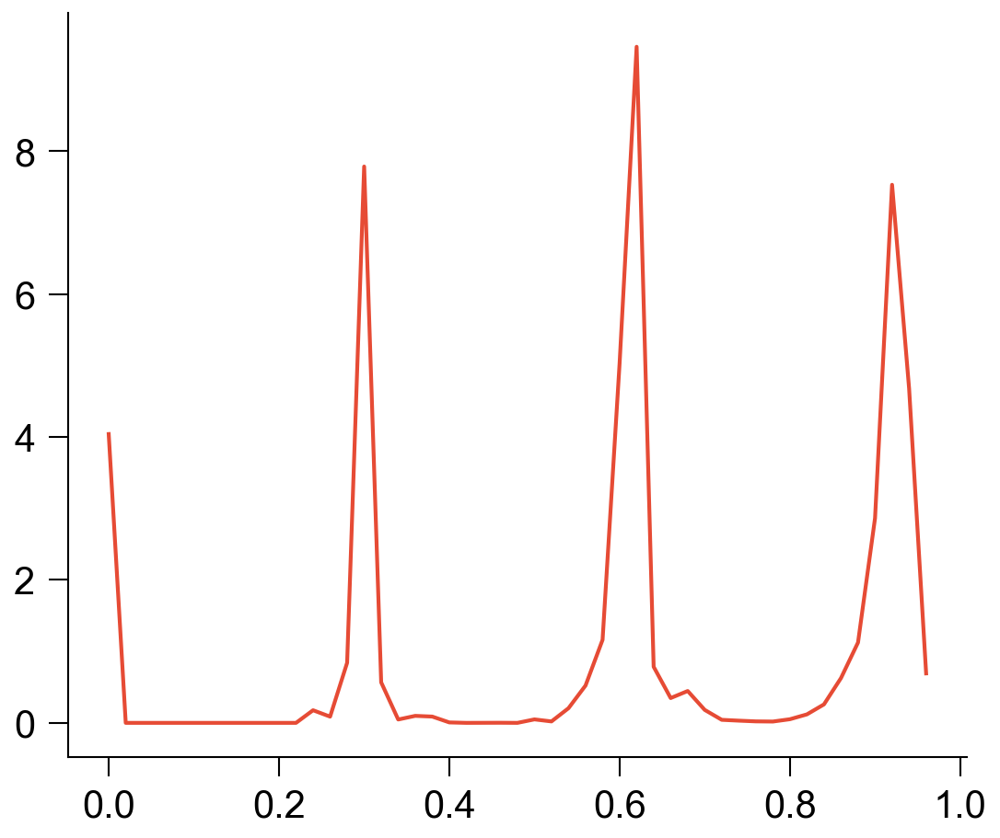

In [79]:
nbins = 50
histo, bins = np.histogram(system, bins = np.arange(0,1,1/nbins), density=True)
with plt.style.context(spstyle.get_style('thesis')):
    fig, ax = plt.subplots(figsize=(4.2, 3.5))
    
    ax.plot(bins[:-1], histo)
    
    plt.show()

#   Transiant time

In [2]:
nbproject = np.arange(1,4)
fnb = np.arange(1,9)
folderpath = "/data1/DATA_Duplat/Brut/Correlation2"

Tnu = [None]*len(fnb)
Time = np.zeros((len(nbproject), len(fnb)))
L1 = 0
L2 = 0
for i, n in enumerate(nbproject):
    for j, m in enumerate(fnb):
        subfolderpath = "{}/Co{}n{}".format(folderpath, n, m)
        params = read_parameters(subfolderpath)
        
        
        if i == 0:
            Tnu[j] = params[2]
        if j == 0: 
            L1 = params[0]
            L2 = params[1]
            

        iniava = params[19][0]
        deltaava = params[19][1]
        nbava = params[8]
        
        #print(i, j, iniava, deltaava, nbava)
        clentab , avgtab = corrlength(subfolderpath, iniava, deltaava, nbava, L2, numcol=0, switch_plot= 0)
        filt_clenfit, filt_avgfit, _ = corrlengthfit(subfolderpath, L2, iniava, deltaava, clentab, numcol = 0, switch_plot= 0)
        
        # mask = filt_avgfit != 0
        # filt_avgfit=filt_avgfit[mask]

        id = np.where(filt_clenfit[:,1] > filt_avgfit[-1])[0][0]
        Time[i,j] = filt_clenfit[id,0]
        


/home/kduplat/Documents/py38/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


In [3]:
#Correction visuelle dans le cas nu = 0.03
Size = [256,128,64]

Time[1,0] = 1e5
Time[2,0] = 1e4
Time[2,1] = 3e4

[1.70e+06 3.40e+06 6.80e+06 1.57e+07 4.10e+07 9.10e+07 7.60e+08 8.60e+09]
[1.00e+05 5.10e+05 8.80e+05 1.76e+06 4.80e+06 1.11e+07 4.40e+07 2.90e+08]
[1.00e+04 3.00e+04 8.30e+04 1.86e+05 3.10e+05 7.80e+05 4.00e+06 1.60e+07]


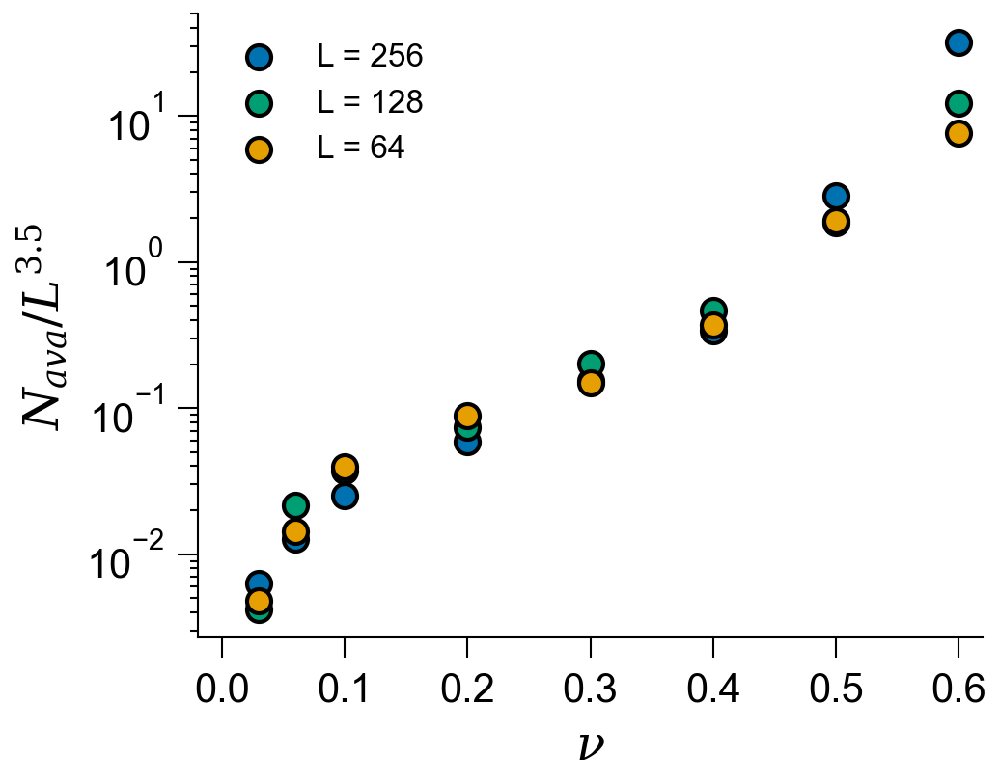

In [4]:

with plt.style.context(spstyle.get_style('thesis')):
    fig, ax = plt.subplots(figsize = (3.5,2.8))
    for i, n in enumerate(nbproject):
        print(Time[i])
        ax.scatter(Tnu, Time[i]/(Size[i]**3.5), c = color_list[i], label = "L = {}".format(Size[i]))
        
    ax.legend()
    ax.set_yscale('log')
    ax.set_xlim(-0.02,0.62)
    ax.set_xlabel(r"$\nu$")
    ax.set_ylabel(r"$N_{ava}/L^{3.5}$")
    ax.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])
    # plt.savefig("Transient_time.pdf", dpi = 600)
    plt.show()
            

        

# Inter-time

In [5]:
fnb = np.arange(1,15)
folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
Tvar = [read_parameters(folder)[2] for folder in folderpath]
NCURVES = len(Tvar)

nbins = 1000
folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]

# results_it = Parallel(n_jobs=-1)(delayed(process_time)(folder, nbins + 1)
#                                   for folder in folderpath)

results_it = np.array(Parallel(n_jobs=-1)(delayed(process_time_from_histo)(folder, nbins + 1)
                                  for folder in folderpath))

In [25]:
Tstart_x = [1e-6,1e-10,1e-6,1e-10,1e-7,
           1e-10,1e-10,1e-10,1e-10,1e-10,
           1e-10,1e-10,1e-10,1e-10]

Tstop_x = [1e-1,1e-1,1e-1,1e-1,1e-1,
        1e-1,1e-5,1e-5,4e-4,5e-3,
        4e-2,5e-2,5e-2,3e-2]

nb_reduced_bins = 100

Tpdf,Txfit, Tyfit, Tgamma, Tperr =  PDF_it_histogram(results_it, Tstart_x, Tstop_x, nb_reduced_bins)

/tmp/ipykernel_2035541/1677429412.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


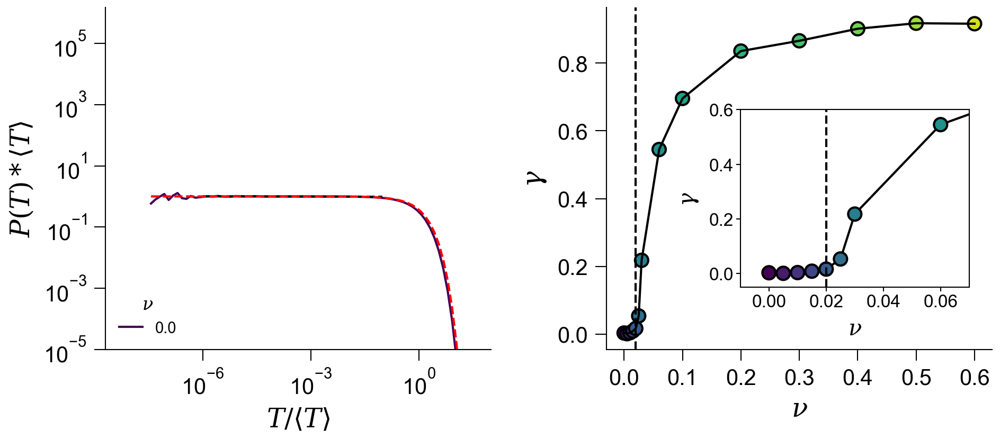

In [27]:
with plt.style.context(spstyle.get_style('thesis')):

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(7.2, 2.8))
    fig.subplots_adjust(wspace = 0.3)
    
    NCURVEs = len(Tpdf)
    colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]
    
    for j, (histo, xfit, yfit) in enumerate(zip(Tpdf, Txfit, Tyfit)):
        ax1.plot(histo[:,0], histo[:, 1], color = colors[j], label = '{}'.format(Tvar[j]))
        ax1.plot(xfit,yfit, 'k--')
        break
        
    poisson = gamma_distribution(histo[:,0], 1, -0.0, 1.)
    ax1.plot(histo[:,0], poisson, linestyle = '--', color = 'red')
    
    ax2.errorbar(Tvar, -Tgamma, yerr = Tperr, c = 'k')
    ax2.scatter(Tvar, -Tgamma, c = colors[:], zorder=2, marker = 'o')
    ax2.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)

    ax22 = fig.add_axes([0.68, 0.25, 0.2, 0.4])
    ax22.plot(Tvar, -Tgamma, linestyle = '-', c = 'k', zorder=1)
    ax22.scatter(Tvar, -Tgamma, c = colors[:], zorder=2, marker = 'o')
    ax22.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)
    
    
    ax1.set_xlim(2e-9, 1e2)
    ax1.set_ylim(1e-5, 1.5e6)
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlabel(r'$T/\langle T \rangle$')
    ax1.set_ylabel(r'$P(T) * \langle T \rangle$')
    ax1.legend(title = r"$\nu$", loc = "lower left", ncol = 3, columnspacing=1.0, handlelength=1.5, fontsize = 7, title_fontsize = 8)
    
    ax2.set_xlabel( r'$\nu$')
    ax2.set_ylabel(r'$\gamma$')
    ax2.set_xticks([0,0.1,0.2,0.3,0.4,0.5,0.6])
    
    ax22.set_xlim(-0.01,0.07)
    ax22.set_ylim(-0.05,0.6)
    ax22.set_xticks([0,0.02,0.04,0.06])
    ax22.set_xlabel( r'$\nu$', fontsize=10)
    ax22.set_ylabel(r'$\gamma$', fontsize=10)
    ax22.spines['top'].set_visible(True)
    ax22.spines['right'].set_visible(True)
    ax22.tick_params(labelsize = 8, length = 2, pad = 1)
    
    plt.show()
    

#   Spatial clustering

In [4]:
L1 = 256
L2 = 256

Tfilepath = ["/data1/DATA_Duplat/Brut/PDF/PD5n{}/Avalanche_outputB.gz".format(n) for n in np.arange(1,15)]
for i in range(6):
    Tfilepath[i] = "/data1/DATA_Duplat/Brut/PDF/PD7n{}/Avalanche_outputB.gz".format(i+1)
    
Tfolderpath = ["/data1/DATA_Duplat/Brut/PDF/PD5n{}/".format(n) for n in np.arange(1,15)]
Tnu = [read_parameters(folder)[2] for folder in Tfolderpath]

In [5]:
avg_distance = np.zeros(len(Tnu))
for i, file in enumerate(Tfilepath):
    
    if Tnu[i] == 0:
        data = read_gz_with_pandas_nrows(file, nrows=int(1e7), skiprows=0, cols=[2])
    else:
        data = read_gz_with_pandas_nrows(file, nrows=int(1e7), skiprows=int(5e7), cols=[2])
        
        
    y, x = np.unravel_index(data, (L1,L2))

    x = x[:,0]
    y = y[:,0]
    
    diff_x = np.diff(x)
    diff_y = np.diff(y)
    r = np.sqrt(diff_x**2 + diff_y**2)
    avg_distance[i] = np.mean(r)

In [6]:
Tfolderpath = ["/data1/DATA_Duplat/Brut/PDF/PD12n{}/".format(n) for n in np.arange(1,15)]
Tnu = [read_parameters(folder)[2] for folder in Tfolderpath]

r = 1
y, x = np.ogrid[-r:r+1, -r:r+1] # Créé une grille mais pas en matrice, directement en coordonnée
kernel = x**2 + y**2 <= r**2 # Fait un masque des coo contenu dans le cercle de rayon r 

In [7]:
nrows = 10000
nbfolder = 14
mean_dt = np.zeros(nbfolder)
L1 = 256
L2 = 256
for j in range (1,nbfolder):
    file = "/data1/DATA_Duplat/Brut/PDF/PD12n{}/Avalanche_outputB.gz".format(j)
    
    data = read_gz_with_pandas_nrows(file, nrows, skiprows=1, cols=[2,3])
    nin = np.array(data[:,0], dtype = int)
    dz = data[:,1]
    z = np.cumsum(dz)
    
    y, x = np.unravel_index(nin, (L1,L2))
    
    sys = np.zeros((L1, L2), dtype = float)

    sys[x[0], y[0]] = 1
    dt = np.zeros(nrows)
    for i, (xp, yp) in enumerate(zip(x[1:], y[1:])):
        x_min = max(xp - r, 0)
        x_max = min(xp + r+1, L1) #Avoid to be outside the system
        y_min = max(yp - r, 0)
        y_max = min(yp + r+1, L2)
        subsys = sys[x_min:x_max, y_min:y_max]
        sub_kernel = kernel[(x_min - (xp - r)):(x_max - (xp - r)),(y_min - (yp - r)):(y_max - (yp - r))]

        if (np.sum(subsys[sub_kernel]) == 0):
            # sys[xp,yp] = i+2    #At i = 0, we start at two since the sys is set to 0 and the first com to 1
            sys[xp,yp] = z[i+1]
        else:
            u_val = np.unique(subsys[sub_kernel])
            max_t = np.max(subsys[sub_kernel])
            for val in u_val:
                if val != 0:
                    sys[sys == val] = z[i+1]
            dt[i+1] = z[i+1] - max_t
            
    # print(dt, np.mean(dt))
    mean_dt[j-1] = np.mean(dt[dt!=0])

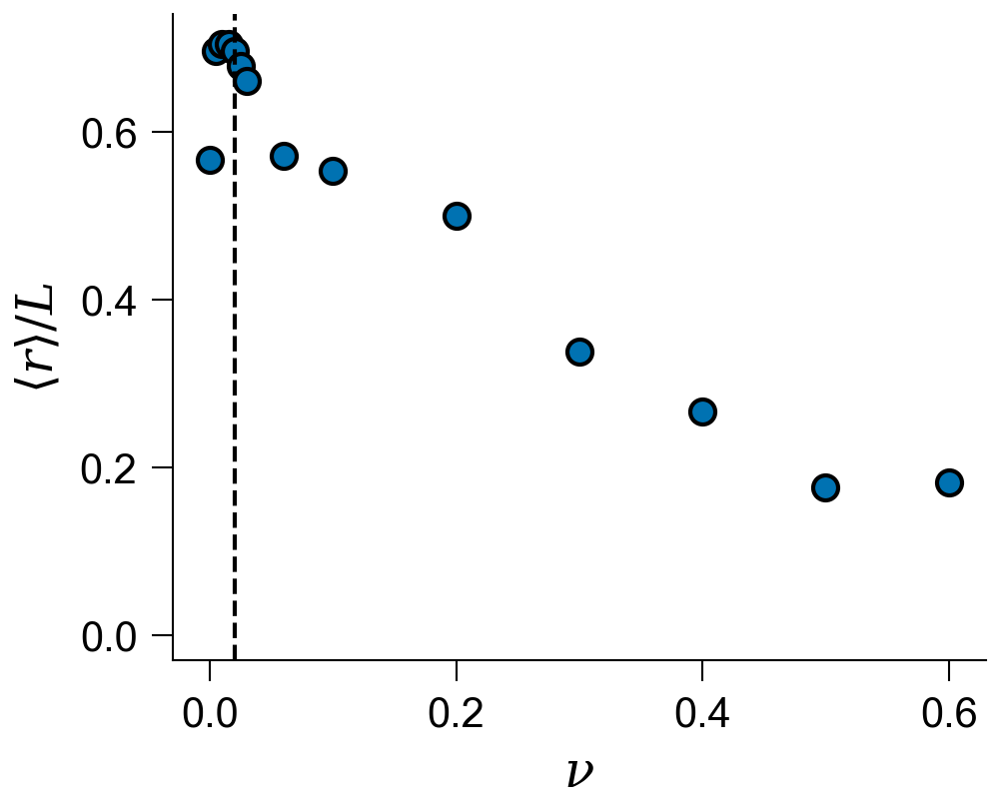

In [10]:
with plt.style.context(spstyle.get_style('thesis')):
    fig, ax = plt.subplots(1, 1, figsize = (3.5,2.8))
    # ax2 = ax.twinx()
    ax.scatter(Tnu, avg_distance/L1,c = color_list[0])
    # ax2.scatter(Tnu, mean_dt, c = color_list[2])
    
    ax.axvline(0.02, ls = '--', c = 'k')
    ax.set_xlabel(r'$\nu$')
    # ax.spines['top'].set_visible(True)
    # ax.spines['right'].set_visible(True)
    ax.set_ylim(-0.03,0.74)
    ax.set_ylabel(r'$\langle r \rangle/L$')
    # ax.spines['left'].set_color(color_list[0])
    # ax.tick_params(axis='y', colors=color_list[0])
    # ax.yaxis.label.set_color(color_list[0])
    
    # ax2.set_ylabel(r"$\langle \delta h_c \rangle$")
    # ax2.spines['right'].set_color(color_list[2])
    # ax2.tick_params(axis='y', colors=color_list[2])
    # ax2.yaxis.label.set_color(color_list[2])
    
    # plt.savefig("Spatial2.pdf", dpi = 300)
    plt.show()

#   Traces

In [2]:
data = np.load("/home/kduplat/Documents/Data/Pscript2/Papier_Memory/Figure2.npz", allow_pickle=True)


Tvar = data["Tvar"]
Ttau_s = data["Ttau_s"]
Tbins_s = data["Tbins_s"]
Thisto_s = data["Thisto_s"]
Txfit_s = data["Txfit_s"]
Tyfit_s = data["Tyfit_s"]
Tnonzero_s= data["Tnonzero_s"] 
Tmean_s= data["Tmean_s"]
Tmean_t= data["Tmean_t"]
Tmean_diff= data["Tmean_diff"]

/tmp/ipykernel_2035541/1114159044.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


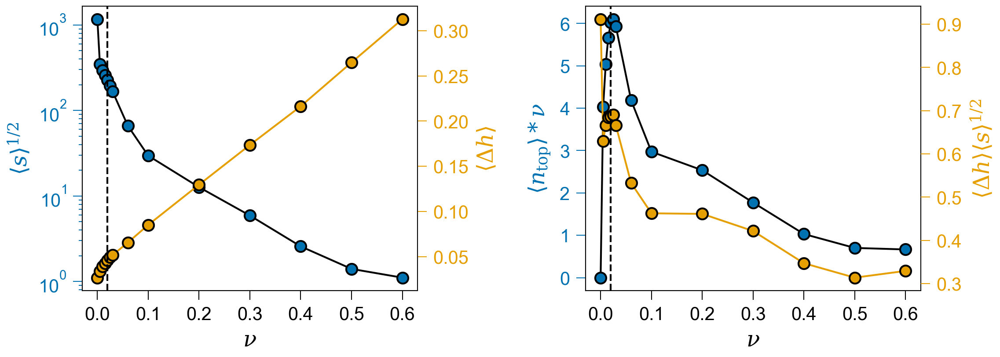

In [52]:
from matplotlib.ticker import FixedLocator, NullLocator
NCURVES = len(Tvar)
with plt.style.context(spstyle.get_style('thesis')):
    fig, (ax5, ax3) = plt.subplots(1,2, figsize=(8.2, 2.8))
    fig.subplots_adjust(wspace = 0.5)
    colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]



    ################## Avg_dissipated energy ##################
    ax3.scatter(Tvar, Tmean_t * Tvar, c=color_list[0], marker='o', zorder=2)
    ax3.plot(Tvar, Tmean_t * Tvar, c = 'k', zorder = 1)

    ax32 = ax3.twinx()
    ax32.plot(Tvar, Tmean_diff*Tmean_s**(1/2), marker = 'o', c = color_list[2])
    ax32.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)
    

    
    ax3.set_xlabel(r'$\nu$')
    ax3.set_ylabel(r'$\langle n_\mathrm{top} \rangle * \nu$')
    ax32.set_xlabel(r'$\nu$')
    ax32.set_ylabel(r'$ \langle \Delta h\rangle \langle s\rangle^{1/2}$')
    ax32.set_yticks([0.3, 0.4,  0.5, 0.6, 0.7,0.8, 0.9])
    ax32.tick_params(axis='y', colors=color_list[2])
    ax32.yaxis.label.set_color(color_list[2])
    ax3.spines['top'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    ax3.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])
    ax3.tick_params(axis='y', colors=color_list[0])
    ax3.yaxis.label.set_color(color_list[0])

    

    ################## <s> <dz> ##################
    ax5.scatter(Tvar, Tmean_s, c = color_list[0], zorder=2, marker = 'o')
    ax5.plot(Tvar, Tmean_s, c = 'k', zorder=1)

    ax52 = ax5.twinx()
    ax52.plot(Tvar, Tmean_diff, marker = 'o', c =color_list[2])
    ax52.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)

    ax5.set_xlabel(r'$\nu$')
    ax5.set_ylabel(r'$\langle s \rangle^{1/2}$')
    ax5.set_yscale('log')
    ax5.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])
    ax5.tick_params(axis='y', colors=color_list[0], which = "both")
    ax5.yaxis.label.set_color(color_list[0])
    
    # ax5.xaxis.set_visible(False)
    ax52.set_xlabel(r'$\nu$')
    ax52.set_ylabel(r'$\langle  \Delta h \rangle$')
    ax52.spines['top'].set_visible(True)
    ax52.spines['right'].set_visible(True)
    ax52.set_yticks([0.05,0.1,0.15,0.2,0.25,0.3])
    ax52.tick_params(axis='y', colors=color_list[2])
    ax52.yaxis.label.set_color(color_list[2])

    

    plt.savefig("Fig2_2.pdf",  bbox_inches='tight', dpi = 300)
    plt.show()


/tmp/ipykernel_3174010/1734752881.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


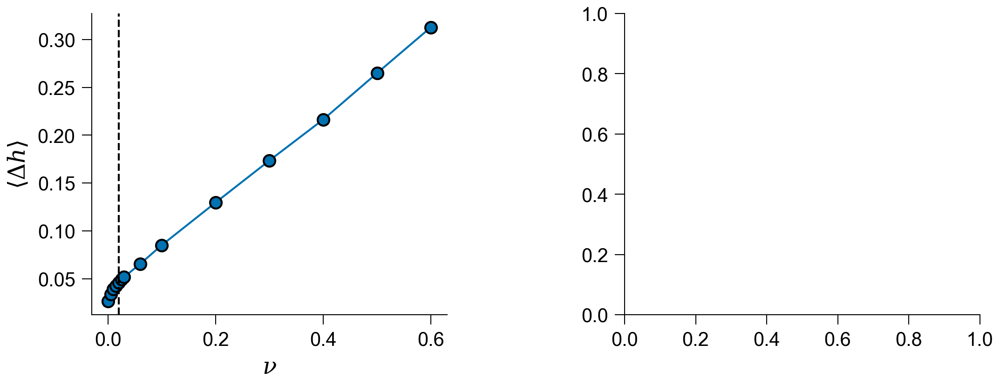

In [6]:
from matplotlib.ticker import FixedLocator, NullLocator
NCURVES = len(Tvar)
with plt.style.context(spstyle.get_style('thesis')):
    fig, (ax5, ax3) = plt.subplots(1,2, figsize=(8.2, 2.8))
    fig.subplots_adjust(wspace = 0.5)
    colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

    

    ################## <s> <dz> ##################

    ax5.plot(Tvar, Tmean_diff, marker = 'o', c =color_list[0])
    ax5.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]), zorder = 2)

    
    ax5.set_xlabel(r'$\nu$')
    ax5.set_ylabel(r'$\langle  \Delta h \rangle$')
    ax5.set_yticks([0.05,0.1,0.15,0.2,0.25,0.3])


    plt.show()


##  Cas favorable

2445


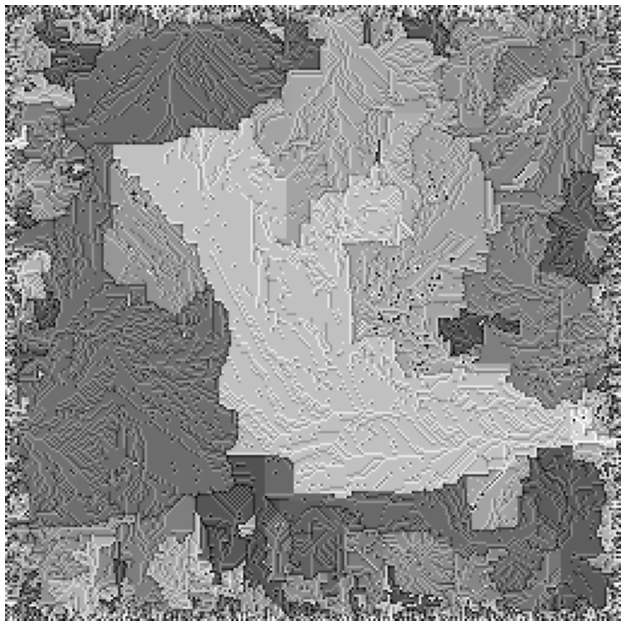

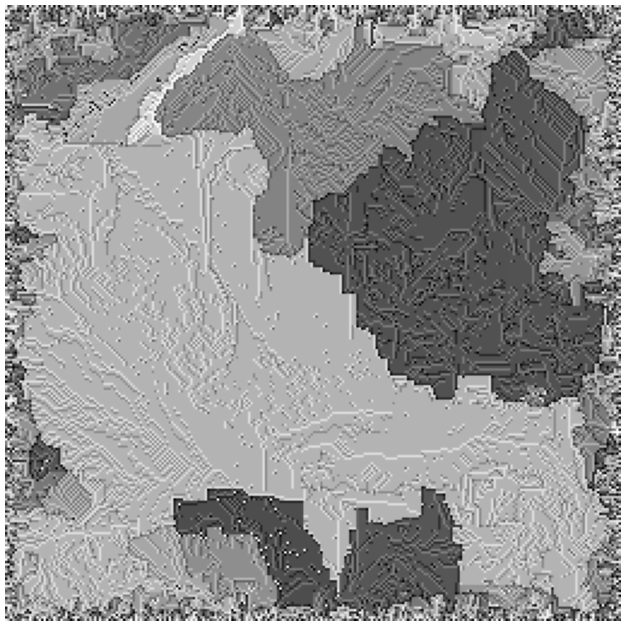

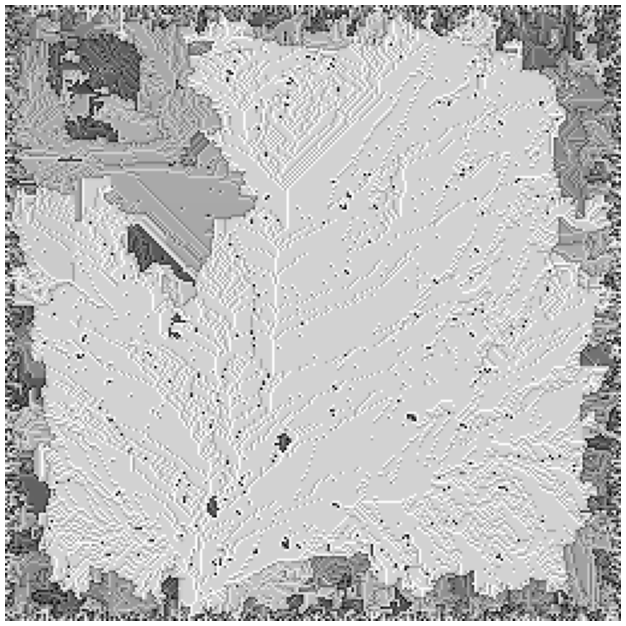

In [107]:
data = np.loadtxt("/data1/DATA_Duplat/Brut/Memory_effects/Me1n4/prediction_s3.txt")

print(np.argmax(data[:,1]))
idmax = np.argmax(data[:,1])
L1 = 256
L2 = 256

snapshotsbis(["/data1/DATA_Duplat/Brut/Memory_effects/Me1n4/Snapshots/nav{}.txt".format(int(data[idmax-800, 0])),
              ], L1, L2, switch=0, sizeploth = 15, sizeplotw = 8)
snapshotsbis(["/data1/DATA_Duplat/Brut/Memory_effects/Me1n4/Snapshots/nav{}.txt".format(int(data[idmax-600, 0])),
              ], L1, L2, switch=0, sizeploth = 15, sizeplotw = 8)

snapshotsbis(["/data1/DATA_Duplat/Brut/Memory_effects/Me1n4/Snapshots/nav{}.txt".format(int(data[idmax, 0])),
              ], L1, L2, switch=0, sizeploth = 15, sizeplotw = 8)



## Cas défavorable

138489638.0


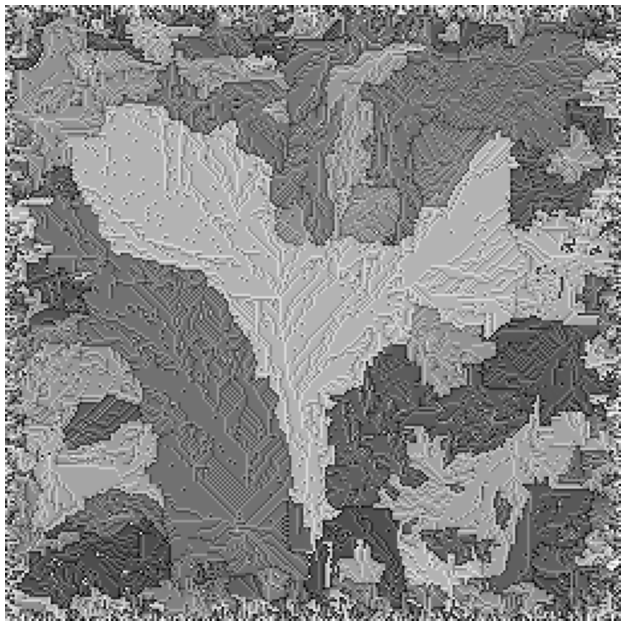

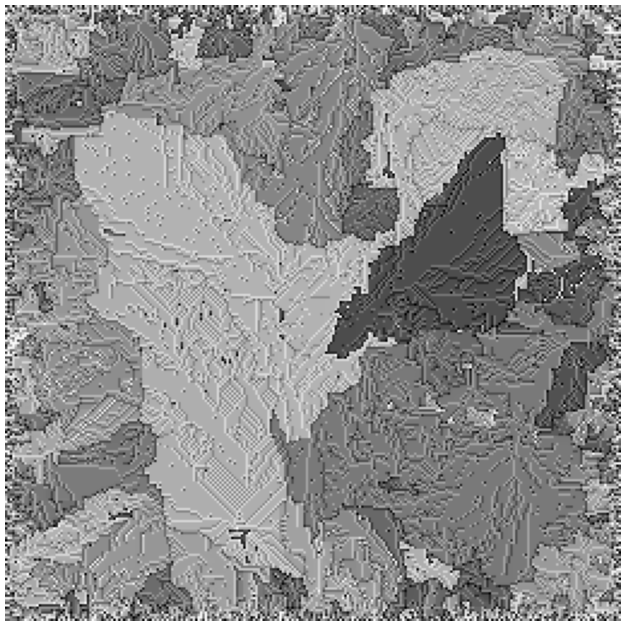

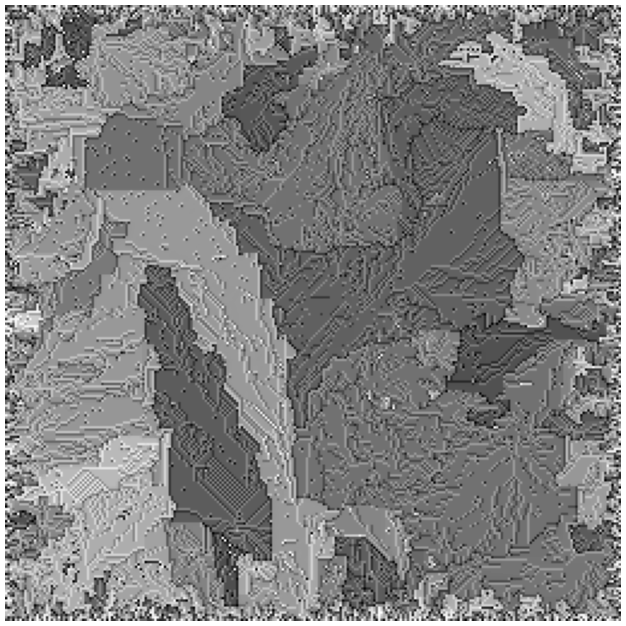

In [153]:
print(data[idmax-1000, 0])
snapshotsbis(["/data1/DATA_Duplat/Brut/Memory_effects/Me1n4/Snapshots/nav{}.txt".format(int(data[idmax-1000, 0])),
              ], L1, L2, switch=0, sizeploth = 15, sizeplotw = 8)

snapshotsbis(["/data1/DATA_Duplat/Brut/Memory_effects/Me1n4/Snapshots/nav{}.txt".format(140765853),
              ], L1, L2, switch=0, sizeploth = 15, sizeplotw = 8)
snapshotsbis(["/data1/DATA_Duplat/Brut/Memory_effects/Me1n4/Snapshots/nav{}.txt".format(144559967),
              ], L1, L2, switch=0, sizeploth = 15, sizeplotw = 8)

#   CC

In [7]:
def loghisto(linhisto, nbins = 0):
    data = linhisto
    
    last_non_zero = np.nonzero(data)[0]
    nmax = last_non_zero[-1]
    if nbins == 0:
        nbins = freedman_diaconis_log_bins(data[:nmax])
    
    bins, histo = new_logbins(data[:nmax], nbins) #Transforme les bins lin en bins log
    bin_center = (bins[1:] + bins[:-1])/2
    
    mask = histo != 0
    f_histo = histo[mask]
    f_bin_center = bin_center[mask]
    
    return f_histo, f_bin_center

def count_lines_gz_safe(filename, csize = 1000):
    count = 0
    chunk_size = csize 
    try:
        with gzip.open(filename, 'rb') as f:
            leftover = b''
            while True:
                chunk = f.read(chunk_size)
                if not chunk:
                    break
                lines = (leftover + chunk).split(b'\n')
                leftover = lines.pop()  # dernière ligne peut être tronquée
                count += len(lines)
            if leftover:
                count += 1  # compte la dernière ligne même si tronquée
    except EOFError:
        # fichier tronqué, on arrête là et on retourne le compte
        pass
    return count

def process_parallel_load(foldernb, nb = [1,2,3,4,5,6,7,8,9], chunksize = 1e6, L = 64, limdata = 1e6, cols = [12], nbins = 50):

    logbins_s = np.logspace(np.log(1), np.log(L**2), nbins)
    histo_s = np.zeros(len(logbins_s)-1)
    
    logbins_a = np.logspace(np.log(1/L**2), np.log(1), nbins)
    histo_a = np.zeros(len(logbins_a)-1)
    for i in nb:
        file = "/data1/DATA_Duplat/Brut/Memory_effects/Me{}n{}/random_random.gz".format(foldernb,i)
        if chunksize >= 1e5:
            nblines = 0
            
            for chunk in chunked_file_reader(file, chunksize = chunksize, usecols=cols):
                histo_s += np.histogram(chunk.iloc[:, 0], bins = logbins_s)[0]
                histo_a += np.histogram(1/chunk.iloc[:, 0], bins = logbins_a)[0]
                
                nblines += len(chunk)
            
                if nblines >= limdata:
                    break
                
        if chunksize < 1e5:
            with gzip.open(file, "rt") as f:
                for i, line in enumerate(f):
                    if line.startswith("#"):
                        continue
                    
                    s= int(float(line.strip().split()[cols[0]]))

                    id = np.searchsorted(logbins_s, s, side='right') -1
                    histo_s[id] += 1
                    
                    id = np.searchsorted(logbins_a, 1/s, side='left') - 1
                    histo_a[id] += 1
                    
                    if i >= limdata:
                        break
        
            
    # log_histo, log_bins = loghisto(histo_s)
    norm_histo_s = histo_s/((np.diff(logbins_s)) * np.sum(histo_s))
    norm_histo_a = histo_a/((np.diff(logbins_a)) * np.sum(histo_a))
    
    return logbins_s, norm_histo_s, logbins_a, norm_histo_a
    # return log_bins, log_histo, logbins_a, norm_histo_a

def floor_sig(x, n=1): #Pour récupére le floor de la valeur
    p = int(np.floor(np.log10(abs(x))))
    fact = 10 ** (p - n + 1)
    return int(np.floor(x / fact) * fact)

        
def full_analysis(Tfolder_nb, nbins = 50, cols = [12], nbfolder = [1,2,3,4,5,6,7,8,9]): #To sum different realisation in the same project
    Tnbline = [None]*len(Tfolder_nb)
    Tnu = [None]*len(Tfolder_nb)
    TL = [None]*len(Tfolder_nb)
    
    f_log_histo = []
    f_bin_centers_s = []
    f_bin_centers_a = []
    f_norm_histo_a = []

    
    for j, nb in enumerate(Tfolder_nb):
        project =  "/data1/DATA_Duplat/Brut/Memory_effects/Me{}".format(nb)
        Tnu[j] = read_parameters("{}n1".format(project))[2]
        TL[j] = read_parameters("{}n1".format(project))[0]
        
        min = 1e10
        for i in nbfolder:
            file = "{}n{}/random_random.gz".format(project, i)
            nbl = floor_sig(count_lines_gz_safe(file), 2)
            if nbl < min:
                min = nbl
        print(min)
        Tnbline[j] = min
        
    results = Parallel(n_jobs=-1)(delayed(process_parallel_load)(nb, nbfolder, nbline/10, L, nbline, cols = cols, nbins = nbins)
                                    for (nb, L, nbline) in zip(Tfolder_nb, TL, Tnbline))
    
    for i, (bins_s, histo_s, bins_a, hist_a) in enumerate(results):
        
        bin_centers_s = (bins_s[:-1] + bins_s[1:])/2
        bin_centers_a = (bins_a[:-1] + bins_a[1:])/2
    
        mask = histo_s !=0
        f_bin_centers_s.append(bin_centers_s[mask])
        f_log_histo.append(histo_s[mask])
    
        mask = hist_a!=0
        f_bin_centers_a.append(bin_centers_a[mask])
        f_norm_histo_a.append(hist_a[mask])
    
    return f_bin_centers_s, f_log_histo, f_bin_centers_a,f_norm_histo_a



In [8]:
Tfolder_nb = [77,78,79,80,81,83, 82]
Tbin_s1, Thisto_s1, Tbin_a1, Thisto_a1 = full_analysis(Tfolder_nb, nbfolder = [2,3,4,5,6,7,8,9], nbins = 50, cols =[12])

36000
360000
390000
380000
360000
290000
340000


In [9]:
Tfolderpath = ["/data1/DATA_Duplat/Brut/Memory_effects/Me9n{}".format(n) for n in range(1,11)]

nbfolder = len(Tfolderpath)
nbline = 1000
nbcol = 3
data = np.empty((nbfolder,nbline,nbcol))

mask = [8,10,12]
data = [np.loadtxt("{}/random_random.txt".format(folderpath), usecols = mask) for folderpath in Tfolderpath]
data = np.vstack(data)

In [10]:
linhisto_1, linbins_1 = np.histogram(data[:,2], bins = np.arange(1,64*64+1))
linhisto_10, linbins_10 = np.histogram(data[:,1], bins = np.arange(1,64*64+1))
linhisto_100, linbins_100 = np.histogram(data[:,0], bins = np.arange(1,64*64+1))
log_histo_1, log_bins_1 = loghisto(linhisto_1, nbins = 0)
log_histo_10, log_bins_10 = loghisto(linhisto_10, nbins = 0)
log_histo_100, log_bins_100 = loghisto(linhisto_100, nbins = 0)

/tmp/ipykernel_3174010/1345913782.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


0.9996666666666667
0.0
0.0
0.0
0.0
0.0
0.9988888888888889
0.998
0.996
0.987
0.9813333333333333
0.9836842105263158


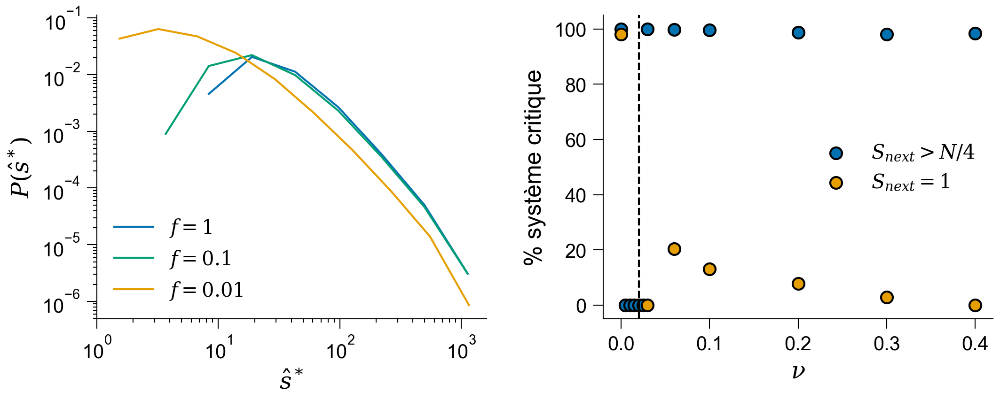

In [11]:
import warnings
from matplotlib.ticker import FixedLocator, NullLocator
from mpl_toolkits.axisartist.axislines import SubplotZero

warnings.resetwarnings()

Tfolderpath = ["/data1/DATA_Duplat/Brut/Memory_effects/Me60n{}".format(nb) for nb in range(1,13)]

Tnu = [0.0, 0.1, 0.2, 0.3 ,0.4, 0.5, 0.6]
Tn_try = [1]*len(Tnu)
Tstop = [1e4, 6e3, 1.2e4, 1e4, 1e4, 5e3, 2e3]
Tstart = [1000, 1e3, 400, 200, 100, 40, 15]
Ttau = [None]*len(Tnu)
NCURVES = len(Tnu)
Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

max_nbtry = 6554

warnings.filterwarnings("error")
with plt.style.context(spstyle.get_style('thesis')):
    
    fig, (ax2, ax1) = plt.subplots(1,2,figsize= (8.2,2.8 ))
    fig.subplots_adjust(wspace = 0.3)
    
    ######NTRY######
    for i, folder in enumerate(Tfolderpath):
        nu = read_parameters(folder)[2]
        small_data = np.loadtxt("{}/random_small.txt".format(folder))
        try:
            large_data = np.loadtxt("{}/random_large.txt".format(folder))
        except UserWarning:
            large_data = np.ones((1,6))
            large_data[0,-1] = max_nbtry
        
        mask_small = small_data[:, -1] != max_nbtry
        mask_large = large_data[:, -1] != max_nbtry
        
        f_small = small_data[mask_small]
        f_large = large_data[mask_large]
        
        p_small = len(f_small)/len(small_data)
        p_large = len(f_large)/len(large_data)
        print(p_large)
        if i == 0:
            ax1.scatter(nu,  p_large*100, c = color_list[0], label = r"$S_{next} > N/4$")
            ax1.scatter(nu,  p_small*100, c = color_list[2], label = r"$S_{next} = 1$" )
            
        else:
            ax1.scatter(nu,  p_small*100, c = color_list[2])
            ax1.scatter(nu,  p_large*100, c = color_list[0])
    
    ax2.plot(log_bins_1, log_histo_1, label = r'$f=1$', c = color_list[0])
    ax2.plot(log_bins_10, log_histo_10, label = r'$f=0.1$', c = color_list[1])
    ax2.plot(log_bins_100, log_histo_100, label = r'$f=0.01$', c = color_list[2])
    ax1.axvline(0.02, c = 'k', ls = '--')
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlabel(r'$\hat s^*$')
    ax2.set_ylabel(r'$P(\hat s^*)$')
    ax2.set_xticks([1,10,100,1000])
    ax2.legend(fontsize = 10)
    
    
    ax1.set_xlabel(r'$\nu$')
    ax1.set_ylabel('% système critique')
    ax1.legend(fontsize = 10)
   
    fig.patch.set_alpha(0.0)
    ax1.patch.set_alpha(0.0)
    ax2.patch.set_alpha(0.0)
    plt.show() 
    
warnings.resetwarnings()

#   Earthquakes

In [64]:
def load_and_process_csv(file_path):
    # Charger les données CSV avec pandas
    df = pd.read_csv(file_path)
    # Convertir en numpy array pour traitement similaire
    dataN = df.to_numpy()
    return dataN

def GRlaw(Corners4, mag_ini, mag_end, newdataN, yr_min, inv1):
    x2a = Corners4[0]
    x2b = Corners4[1]
    y2a = Corners4[2]
    y2b = Corners4[3]

    min_depth = -10  # km
    ntot1 = newdataN.shape[0]

    distmag = np.zeros((mag_end - mag_ini, 2))  # (bins, 2)

    for n in range(ntot1):
        for p in range(mag_ini, mag_end):
            # indices Python : distmag[p - mag_ini, :]
            # Extraction colonnes avec indexation 0-based:
            year = newdataN[n, 0]
            lat = newdataN[n, 6]
            lon = newdataN[n, 7]
            depth = newdataN[n, 8]
            mag = newdataN[n, 9]

            # Conditions premières :
            cond1 = (year >= yr_min) and (depth > min_depth) and (mag >= p) and (mag < p + 1) \
                    and (lat >= y2a) and (lat <= y2b)

            # Case inv1==0 : longitude entre x2a et x2b
            if cond1 and (lon >= x2a) and (lon <= x2b) and (not inv1):
                distmag[p - mag_ini, 0] += 1
                distmag[p - mag_ini, 1] = p + 0.5

            # Case inv1==1 : longitude entre x2a et 180 OU -180 et x2b (méridien 180 traversé)
            if inv1 == 1 and cond1 and ((lon >= x2a and lon <= 180) or (lon >= -180 and lon <= x2b)):
                distmag[p - mag_ini, 0] += 1
                distmag[p - mag_ini, 1] = p + 0.5

    return distmag

def GRlawSMoment(corners4, mag_ini, mag_end, newdataN, yr_min, inv1=False):
    """
    Estime la densité d'énergie sismique par bin de magnitude dans une zone géographique.
    
    Parameters:
        corners4 : list or array of float
            [lon_min, lon_max, lat_min, lat_max]
        mag_ini : int
            Magnitude minimale (ex. 4)
        mag_end : int
            Magnitude maximale (ex. 9)
        newdataN : np.ndarray
            Table d’événements : colonnes = [annee, ..., lat (7), lon (8), profondeur (9), magnitude (10)]
        yr_min : int
            Année minimale à considérer
        inv1 : bool
            True si on traverse la ligne de changement de date (180°)
    
    Returns:
        distSM : np.ndarray of shape (mag_end - mag_ini, 2)
            distSM[:,0] = densité d’énergie sismique par bin
            distSM[:,1] = énergie moyenne pour chaque bin de magnitude
    """

    x2a, x2b, y2a, y2b = corners4
    min_depth = 1  # km

    n_bins = mag_end - mag_ini
    distmag = np.zeros((n_bins, 2))
    distSM = np.zeros((n_bins, 2))

    N_events = 0
    for n in range(newdataN.shape[0]):
        year = newdataN[n, 0]
        lat = newdataN[n, 6]
        lon = newdataN[n, 7]
        depth = newdataN[n, 8]
        mag = newdataN[n, 9]

        for p in range(mag_ini, mag_end):
            in_mag_bin = (mag >= p) and (mag < p + 1)
            in_area = (x2a <= lon <= x2b) and (y2a <= lat <= y2b)
            in_cross_area = ((x2a <= lon <= 180) or (-180 <= lon <= x2b)) and (y2a <= lat <= y2b)

            if year >= yr_min and depth > min_depth and in_mag_bin:
                if (not inv1 and in_area) or (inv1 and in_cross_area):
                    idx = p - mag_ini
                    distmag[idx, 0] += 1
                    distmag[idx, 1] = p + 0.5
                    N_events += 1

    # Constantes pour conversion magnitude  énergie
    cst = 1.5 * 6.07  # correspond à 10^(1.5M + cst)

    SumE = 0
    SumE2 = 0

    for p in range(mag_ini, mag_end):
        idx = p - mag_ini
        mag_bin_center = p + 0.5
        e_center = 10 ** (1.5 * mag_bin_center + cst)
        e_bin = 10 ** (1.5 * (p + 1) + cst) - 10 ** (1.5 * p + cst)

        distSM[idx, 1] = e_center
        distSM[idx, 0] = distmag[idx, 0] / e_bin if e_bin != 0 else 0

        SumE += e_center * distSM[idx, 0]
        SumE2 += distSM[idx, 0] * e_bin

    print(f"N_events: {N_events}")
    print(f"SumE: {SumE:.3e}")
    print(f"SumE2: {SumE2:.3e}")

    return distSM

def magnitude(energy):
    return (2/3) * np.log10(energy) - 6.07

def energy(magnitude):
    return 10 ** (1.5 * (magnitude + 6.07))

In [65]:
#%% Paramètres d'énergie
Emax = energy(8.9)  # MagMax=9.1
Emin = energy(0)          # MagMin=6.07
Etot = 6.5297e+22 / 40 
# Etot = 6.5297e+22 * 0.37 / 40         # Total yearly energy excluding tohoku 
print('Etot: ', Etot)


#tau_values = np.array([(n + 7) / 10 for n in range(18)])
tau_values = np.array([0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.67, 1.7, 1.8, 1.9, 2.0, 2.1, 2.2])
b_values = (tau_values - 1)*3/2
# Init array
nbins = 9

ntot = len(tau_values)
Sum001 = np.zeros(ntot)

P_E = np.zeros((ntot, nbins))

norm_P_E = np.zeros((ntot, nbins))

mean_energy = np.zeros(ntot)
mean_energy_y = np.zeros(ntot)
norm_mean_energy_y = np.zeros(ntot)

magnitude_y = np.zeros((ntot, nbins))
mag_norm_y = np.zeros((ntot, nbins))
mean_magnitude_x = np.zeros(ntot)
mean_magnitude_y = np.zeros(ntot)

P_energy8 = np.zeros(ntot)
P_energy0 = np.zeros(ntot)

Ntot = np.zeros(ntot)
Etot2 = np.zeros(ntot)

cdf_magnitude_y = np.zeros((ntot, nbins+1))
magnitude_edge_x = np.linspace(0,9,nbins+1)
b1_values = np.zeros(ntot)
N8 = np.zeros(ntot)



magnitude_x = np.linspace(0,8,nbins) + 0.5
energy_edges = energy(np.linspace(0, 8.9, nbins+1))
E = np.array(10 ** (1.5 * (magnitude_x + 6.07)))


# print(energy_edges)
# print(energy_center)
# print(magnitude_x)

tau_EQ = 1.67
k_orig_ref8 = Etot * (2 - tau_EQ) / (Emax ** (2 - tau_EQ) - Emin ** (2 - tau_EQ))
N_ref_tot = k_orig_ref8 * ( (energy(8.9)**(1-tau_EQ)) - (energy(0)**(1-tau_EQ)) )/(1 - tau_EQ)
E_ref_tot = k_orig_ref8 * ( (energy(8.9)**(2-tau_EQ)) - (energy(0)**(2-tau_EQ)) )/(2 - tau_EQ) #Recalc Etot 

# N_tot_ref=9183139 #nb EQ
print("E tot recalc", E_ref_tot)
print("N tot recalc", N_ref_tot)


for n in range(ntot):
    tau = tau_values[n]
    if tau == 2:
        tau = 2.0000001  # éviter division par zéro
        tau_values[n] = tau

    #Without normalisation
    dE = energy_edges[1:] - energy_edges[:-1]
    
    k_orig = N_ref_tot / np.sum(E**(-tau) * dE) #constant Activity Ntot
    # print("k_N: ", k_orig)
    # k_orig = Etot / np.sum(E**(1-tau) * dE) #Constant Energy E_tot
    # print("k_E: ", k_orig)
    P_E[n] = k_orig * E ** (-tau) 
    # P_E_edge[n] = k_orig * energy_edges ** (-tau)
    
    #With normalisation
    Ntot[n] = np.sum(P_E[n]*dE) 
    N8[n] = P_E[n][magnitude_x == 8.5] *dE[magnitude_x == 8.5]
    Etot2[n] = np.sum(P_E[n] * dE * E)
    norm_P_E[n] = P_E[n]/Ntot[n]
    """ check_norm = np.sum(norm_line01y[n] * dE)
    print("Test normalisation: ", check_norm) """
    
    mean_energy[n] = np.sum(E * norm_P_E[n] * dE)
    mean_energy_y[n] = k_orig * mean_energy[n] ** (-tau)
    """ norm_mean_energy_y[n] = k_orig/Ntot[n] * mean_energy[n] ** (-tau) """
    
    
    #Magnitude, largeur des bins = 1
    magnitude_y[n] = P_E[n] * 1.5 * np.log(10) * E
    # mag_norm_y[n] = magnitude_y[n]/np.sum(magnitude_y[n]) 
    
    """ mean_magnitude_x[n] = np.sum(magnitude_x * mag_norm_y[n])# Moyenne des magnitude """
    mean_magnitude_x[n]= magnitude(mean_energy[n]) #Moyenne des energies en magnitude

    yE_mag = k_orig *  mean_energy[n] ** (-tau)
    mean_magnitude_y[n] = yE_mag * 1.5 * np.log(10) *  mean_energy[n]
    
    """ check_norm_mag = np.sum(mag_norm_y[n])
    print("Tes norm mag: ", check_norm_mag) """
    
    #Cumulative distribution
    SUM = np.sum(magnitude_y[n])
    cdf_magnitude_y[n, :-1] = np.array([(SUM - np.sum(magnitude_y[n, :i]))/SUM for i in range(nbins)])

    Fitx = magnitude_x
    Fity = np.log10(cdf_magnitude_y[n, :-1])

    popt, pcov = curve_fit(expfct2, Fitx[:], Fity[:], maxfev = 1000)
    b1_values[n] = -popt[1]
    
    #Pourcentage d'énergie comptenu dans une gamme de magnitude
    P_energy8[n] = E[-1] * dE[-1] * P_E[n][-1]/np.sum(E*P_E[n]*dE)
    P_energy0[n] = E[0] * dE[0] * P_E[n][0]/np.sum(E*P_E[n]*dE)

    
rate_per_min = N8/(365*24*60)
print("Etot: ", Etot2)
print("Ntot: ", Ntot)

popt, pcov = curve_fit(linlaw, b1_values[7:], b_values[7:], maxfev = 1000)
print(popt)
y_fit_b = linlaw(b1_values, *popt)




Etot:  1.6324249999999998e+21
E tot recalc 1.6324249999999998e+21
N tot recalc 24819295.29526159
Etot:  [1.13547335e+29 8.68457584e+28 5.13462407e+28 1.74285402e+28
 2.84737988e+27 2.88791044e+26 2.38383370e+25 1.80787945e+24
 1.32944025e+23 9.81141994e+21 1.61623909e+21 7.53733000e+20
 6.41953924e+19 7.02873707e+18 1.33681958e+18 5.28423701e+17
 3.37627155e+17]
Ntot:  [24819295.29526159 24819295.29526159 24819295.29526159 24819295.29526159
 24819295.29526159 24819295.29526159 24819295.29526159 24819295.29526159
 24819295.29526159 24819295.2952616  24819295.29526159 24819295.29526159
 24819295.29526159 24819295.2952616  24819295.29526159 24819295.29526159
 24819295.29526159]
[ 1.00677902 -0.01129696]


/tmp/ipykernel_2035541/3284421164.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


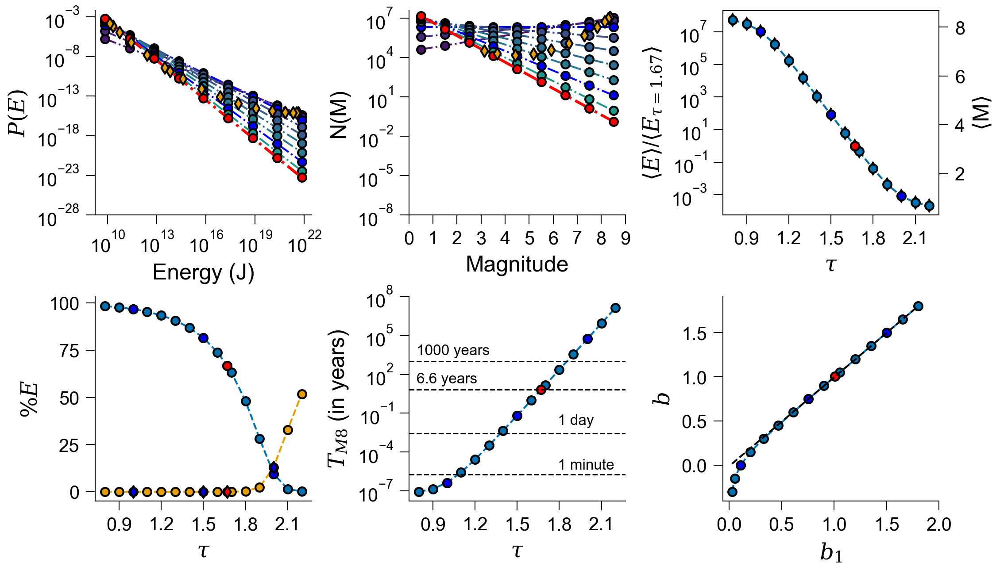

In [73]:

color_list = ['#000000', '#e69f00', '#56b4e9', '#009e73',
              '#f0e442', '#0072b2', '#d55e00', '#cc79a7']

NCURVES = len(tau_values)
colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

with plt.style.context(spstyle.get_style('thesis')):
    
    plt.rc('lines', markersize=4.5)
    
    fig, axs = plt.subplots(2,3, figsize = (8.2, 4.8))
    fig.subplots_adjust(hspace = 0.4, wspace = 0.45)
    ax1 = axs[0, 0]
    ax2 = axs[0, 1]
    ax3 = axs[0, 2]
    ax4 = axs[1, 0]
    ax5 = axs[1, 1]
    ax6 = axs[1, 2]
    ax32 = ax3.twinx()

    for n in range(1,11):
        if tau_values[n] in [1.0, 1.5,2.0000001]:
            ax1.plot(E, P_E[n], '-.o', label=f'tau={tau_values[n]:.2f}', c = 'b')
            ax2.plot(magnitude_x, magnitude_y[n], '-.o',label=f'tau={tau_values[n]:.2f}', c = 'b')
        elif tau_values[n] == 1.67:
            ax1.plot(E, P_E[n], '-.o', label=f'tau={tau_values[n]:.2f}', c = 'r', linewidth= 1.5)
            ax2.plot(magnitude_x, magnitude_y[n], '-.o', label=f'tau={tau_values[n]:.2f}', c = 'r', linewidth= 1.5)
        else:
            ax1.plot(E, P_E[n], '-.o', c = colors[n], linewidth=1)
            ax2.plot(magnitude_x, magnitude_y[n], '-.o',  c = colors[n], linewidth=1)
            
    ax1.scatter(mean_energy, mean_energy_y, marker = 'd', c = color_list[1], zorder = 10)  # point moyen
    ax2.scatter(mean_magnitude_x[:11], mean_magnitude_y[:11], marker = 'd', c = color_list[1], zorder = 10)

    ax3.plot(tau_values[1::1], mean_energy[1::1]/mean_energy[tau_values==1.67], c = color_list[1], marker = 'd', ls = '--')
    mask = np.isin(tau_values, [1.0, 1.5, 1.67, 2.0000001])
    ax32.plot(tau_values[1::1], mean_magnitude_x[1::1], c = color_list[5], marker = 'o', ls = '--')
    ax32.scatter(tau_values[mask], mean_magnitude_x[mask], c = 'b', zorder = 10)
    ax32.scatter(tau_values[tau_values==1.67], mean_magnitude_x[tau_values==1.67], c = 'r', zorder = 10)

    
    ax4.plot(tau_values[1::1], P_energy8[1::1]*100, c = color_list[5], marker = 'o', ls = '--')
    ax4.plot(tau_values[1::1], P_energy0[1::1]*100, c = color_list[1], marker = 'o',ls = '--')
    ax4.scatter(tau_values[mask], P_energy8[mask]*100, marker = 'o', c = 'b', zorder = 10)
    ax4.scatter(tau_values[tau_values==1.67], P_energy8[tau_values==1.67]*100, marker = 'o', c = 'r', zorder = 10)
    ax4.scatter(tau_values[mask], P_energy0[mask]*100, marker = 'd', c = 'b', zorder = 10)
    ax4.scatter(tau_values[tau_values==1.67], P_energy0[tau_values==1.67]*100, marker = 'd', c = 'r', zorder = 10)
    
    mask = [3,8,14]
    # ax6.scatter(tau_values[1:], b_values[1:]/b1_values[1:], marker = 'o', c = color_list[5])
    # ax6.scatter(tau_values[mask], b_values[mask]/b1_values[mask], marker = 'o', c = 'b')
    # ax6.scatter(tau_values[10], b_values[10]/b1_values[10], marker = 'o', c = 'r')
    
    ax6.plot(b1_values[1:], b_values[1:], marker = 'o', c = color_list[5], ls = '--')
    ax6.scatter(b1_values[mask], b_values[mask], marker = 'o', c = 'b', zorder = 2)
    ax6.scatter(b1_values[10], b_values[10], marker = 'o', c = 'r', zorder = 2)
    ax6.plot(b1_values[1:], y_fit_b[1:], ls = '--', c = 'k')
    
    ax5.plot(tau_values[1:], 1/N8[1:], c = color_list[5], marker = 'o', ls = '--')
    ax5.scatter(tau_values[mask],  1/N8[mask], marker = 'o', c = 'b', zorder = 2)
    ax5.scatter(tau_values[10],  1/N8[10], marker = 'o', c = 'r', zorder = 2)
    
    ax5.axhline(1000, c = 'k', ls= '--', lw = 0.75)
    # ax5.axhline(100, c = 'k', ls= '--')
    # ax5.axhline(1, c = 'k', ls= '--')
    ax5.axhline(1/N8[10], c = 'k', ls= '--', lw = 0.75)
    # ax5.axhline(1/12, c = 'k', ls= '--')
    ax5.axhline(1/365, c = 'k', ls= '--', lw = 0.75)
    # ax5.axhline(1/(365*24), c = 'k', ls= '--')
    ax5.axhline(1/(365*24*60), c = 'k', ls= '--', lw = 0.75)

    ax1.set_xlabel('Energy (J)')
    ax1.set_ylabel(r'$P(E)$')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.yaxis.set_ticks([1e-3, 1e-8, 1e-13, 1e-18, 1e-23, 1e-28])
    ax1.xaxis.set_ticks([1e10, 1e13, 1e16, 1e19, 1e22])

    ax2.set_xlabel('Magnitude')
    ax2.set_ylabel('N(M)')
    ax2.set_yscale('log')
    ax2.xaxis.set_ticks([0,1,2,3,4,5,6,7,8,9])
    ax2.yaxis.set_ticks([1e7, 1e4, 1e1, 1e-2, 1e-5, 1e-8])

    ax3.set_xlabel(r'$\tau$')
    ax3.set_ylabel(r'$\langle E \rangle$/$\langle E_{\tau = 1.67} \rangle$')
    ax3.set_yscale('log')
    ax3.spines['top'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    ax3.xaxis.set_ticks([0.9, 1.2, 1.5, 1.8, 2.1])
    ax3.yaxis.set_ticks([1e7, 1e5, 1e3, 1e1, 1e-1, 1e-3])
    # ax32.set_ylabel('<M>')
    #ax32.set_yscale('log')
    ax32.set_ylabel(r'$\langle$M$\rangle$')

    
    ax4.set_xlabel(r'$\tau$')
    ax4.set_ylabel(r'$\%E$')
    ax4.xaxis.set_ticks([0.9, 1.2, 1.5, 1.8, 2.1])
    
    ax5.set_xlabel(r'$\tau$')
    ax5.set_ylabel(r"$T_{M8}$ (in years)")
    ax5.set_yscale('log')
    ax5.xaxis.set_ticks([0.9, 1.2, 1.5, 1.8, 2.1])
    ax5.yaxis.set_ticks([1e-7, 1e-4, 1e-1, 1e2, 1e5, 1e8])
    
    # ax6.set_ylim(0.6,1.1)
    # ax6.yaxis.set_ticks([-11,-9,-7,-5,-3,-1,1])
    # ax6.set_xlabel(r'$\tau$')
    # ax6.set_ylabel(r"$b/b_1$")
    ax6.set_xlabel(r'$b_1$')
    ax6.set_ylabel(r"$b$")
    ax6.xaxis.set_ticks([0, 0.5, 1, 1.5, 2])
    
    
    # ax5.set_yscale('log')
    #ax4.set_yscale('log')
    # ax4.spines['top'].set_visible(True)
    # ax4.spines['right'].set_visible(True)
    #ax62.set_yscale('log')
    
    # fig.text(0.08, 0.87, 'a', fontsize=7, fontweight="bold")
    # fig.text(0.37, 0.87, 'b', fontsize=7, fontweight="bold") 
    # fig.text(0.64, 0.87, 'c', fontsize=7, fontweight="bold") 
    # fig.text(0.08, 0.45, 'd', fontsize=7, fontweight="bold") 
    # fig.text(0.37, 0.45, 'e', fontsize=7, fontweight="bold") 
    # fig.text(0.64, 0.45, 'f', fontsize=7, fontweight="bold") 
    
    fig.text(0.42, 0.34, '1000 years', fontsize = 8)
    fig.text(0.42, 0.295, '{} years'.format(np.round(1/N8[10], 1)), fontsize = 8)
    fig.text(0.55, 0.23, '1 day', fontsize = 8)
    fig.text(0.55, 0.16, '1 minute', fontsize = 8)
    
    
    
    fig.patch.set_alpha(0.0)
    fig.patch.set_alpha(0.0)
    ax1.patch.set_alpha(0.0)
    ax2.patch.set_alpha(0.0)
    ax3.patch.set_alpha(0.0)
    ax4.patch.set_alpha(0.0)
    ax5.patch.set_alpha(0.0)
    ax6.patch.set_alpha(0.0)
    fig.savefig('Fig03.pdf', dpi = 300)
    plt.show()


#   Animation épicentre

/tmp/ipykernel_2325683/2039426028.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('inferno')(i/nrows) for i in range(nrows)]


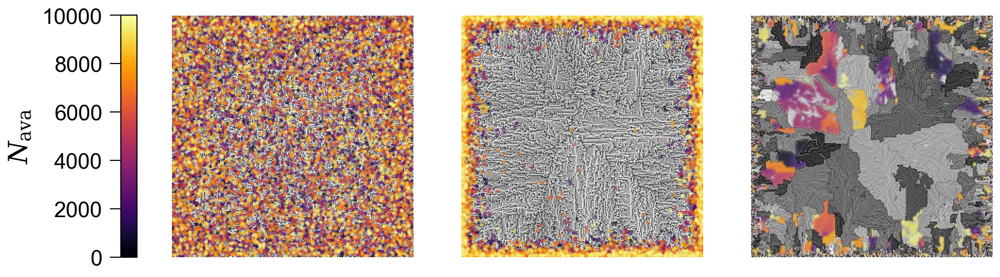

In [5]:
L1 = 256
L2 = 256

nbfolder = [1,4,14]
Talpha = [0.5,0.5,0.1]
nrows = 10000
colors = [plt.cm.get_cmap('inferno')(i/nrows) for i in range(nrows)]

with plt.style.context(spstyle.get_style('thesis')):
    fig, axis = plt.subplots(1,3, figsize = (7.2,2.8))
    for i, nb in enumerate(nbfolder):
        folderpath = "/data1/DATA_Duplat/Brut/PDF/PD12n{}".format(nb)
        sys1 = np.loadtxt("{}/Snapshots/nav1_outputB.txt".format(folderpath)).reshape(L1, L2)
        
        data = read_gz_with_pandas_nrows("{}/Avalanche_outputB.gz".format(folderpath), nrows, skiprows=1, cols=[2,3])
        nin = np.array(data[:,0], dtype = int)
        dz = data[:,1]
        z = np.cumsum(dz)
        y, x = np.unravel_index(nin, (L1,L2))
        
        
        axis[i].imshow(sys1, cmap = "binary")
        axis[i].scatter(x[:nrows], y[:nrows], color = colors, alpha = Talpha[i], s = 0.5)
        
        axis[i].set_axis_off()
        
    norm = plt.Normalize(0, nrows)
    sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
    sm.set_array([])

    cbar = plt.colorbar(sm, ax=axis, location = 'left', fraction=0.0185, aspect = 15, pad = 0.04)
    cbar.set_label(r"$N_{\mathrm{ava}}$")
    plt.show()

/tmp/ipykernel_2154876/841356645.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('inferno')


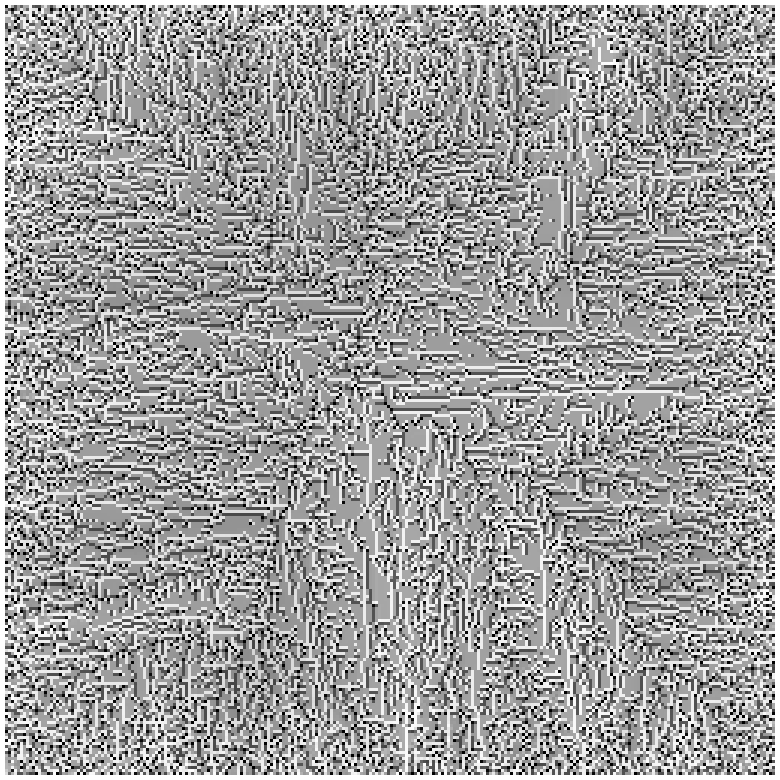

In [28]:

import itertools
folderpath = "/data1/DATA_Duplat/Brut/PDF/PD12n4"
L1 = read_parameters(folderpath)[0]
L2 = read_parameters(folderpath)[1]


nbpoints = 10000
nskip = 10000
init_snap = "{}//Snapshots/nav1_outputB.txt".format(folderpath)
data = read_gz_with_pandas_nrows(f"{folderpath}/Avalanche_outputB.gz", cols = [2], nrows = nbpoints, skiprows = nskip)
sys1 = np.loadtxt(init_snap).reshape(L1, L2)

y, x = np.unravel_index(data, (L1,L2))

fig, ax = plt.subplots(figsize = (10,10))
# ax.set_xlim(-1, L1)
# ax.set_ylim(-1, L2)
# ax.tick_params(labelsize = 28,length = 8, width = 2)
# ax.tick_params(labelsize = 28,length = 5, width = 1, which = 'minor')

ax.imshow(sys1, cmap = "binary")
ax.set_axis_off()

s = plt.scatter([], [])
all_x = []
all_y = []
all_colors = []

frames = 100
nbpoints_plot = nbpoints/frames

NCURVES = int(frames + 1)
cmap = plt.cm.get_cmap('inferno')
colors = itertools.cycle([cmap(i / NCURVES) for i in range(NCURVES)])

def epicenters(i):
    global x,y
    # Récupération des nouveaux points
    start_idx = int(nbpoints_plot * i)
    end_idx = int(nbpoints_plot * (i + 1))
    
    new_x = x[start_idx:end_idx]
    new_y = y[start_idx:end_idx]
    # Ajout des nouveaux points aux points précédents
    all_x.extend(new_x)
    all_y.extend(new_y)
    
    # Ajout de la nouvelle couleur pour chaque nouveau point
    new_color = [next(colors)] * len(new_x)
    all_colors.extend(new_color)
    
    # Mise à jour des offsets avec tous les points accumulés et leurs couleurs respectives
    s.set_offsets(np.column_stack([all_x, all_y]))
    s.set_facecolor(all_colors)
    
    if i == (frames - 1):
        x = np.zeros(0)
        y = np.zeros(0)
        return


In [29]:

import matplotlib.animation as animation

# Création de l'animation
ani = animation.FuncAnimation(fig, epicenters, frames=frames, interval=200)

# Sauvegarde de l'animation sous forme de GIF
ani.save('Epicentre.gif', writer='pillow')

#   P(s)

In [3]:
fnb = np.arange(1,15)
folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
Tvar = [read_parameters(folder)[2] for folder in folderpath]

L1 = read_parameters("/data1/DATA_Duplat/Brut/PDF/PD5n1")[0]
L2 = read_parameters("/data1/DATA_Duplat/Brut/PDF/PD5n1")[1]

In [4]:
results_s = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder))
                                                                    for  folder in folderpath)

Thisto_s, Tbins_s, Tnonzero_s, Tmean_s,Tnbins_s = zip(*results_s)
Tstart_x = [2,2,2,4,1,0,1,3,5,4,4,8,8,8]
Tstop_x = [4.e3, 1.1e4, 9e3, 8e3, 6e3, 1e3, 1e3, 1e4, 2.5e4, 4e4, 4.6e4, 1e4, 1e4, 5e3, 3.8e3]

Txfit_s, Tyfit_s, Ttau_s, Tperr_s = PDF_fitting(Thisto_s, Tbins_s, Tstart_x, Tstop_x, Tvar)



0.96545763582405
0.9950241316250408
0.9912114549630819
0.9970879131270517
0.9967105205796035
0.9906659255469019
0.9877020531728582
0.9272213838997168
0.9122521887346848
0.9705872766834267
0.9174095398449836
0.9057453446744788
0.8991641398725068
0.8933054895985362


/home/kduplat/Documents/py38/lib/python3.8/site-packages/sciplotlib/stylesheets/thesis.mplstyle


/tmp/ipykernel_3079402/3649689382.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = np.array([plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)])


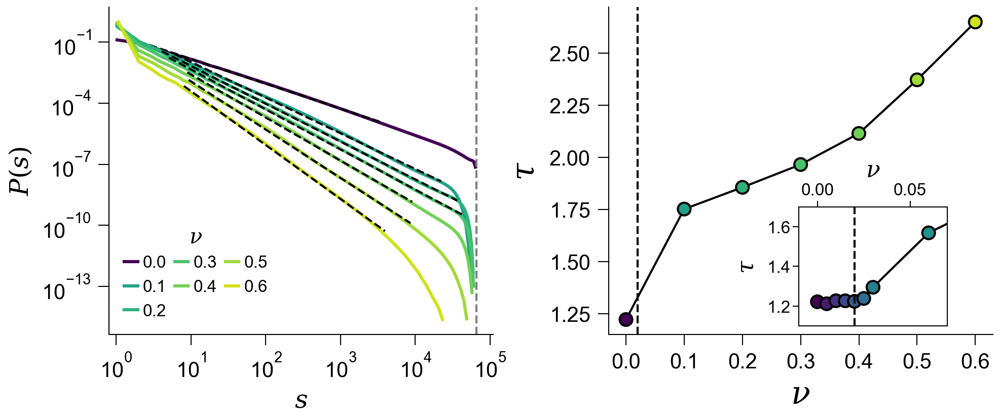

In [5]:

NCURVES = len(Tvar)
colors = np.array([plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)])

id_regime2 = [0,8,9,10,11,12,13]
with plt.style.context(spstyle.get_style('thesis')):
    print(spstyle.get_style('thesis'))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (7.5,2.8))
    fig.subplots_adjust(wspace = 0.3)
    for i, (histo,bins, xfit, yfit, tau, nu) in enumerate(zip(Thisto_s,Tbins_s, Txfit_s, Tyfit_s, Ttau_s, Tvar)):
        # if i == 0 :
        #     ax1.plot(bins,histo, color = color_list[2], label = nu, lw = 1.5)
        # elif i<5:
        #     ax1.plot(bins,histo, color = color_list[3], label = nu, lw = 1.5)
        # else:
        if i in [1,2,3,4,5,6,7]:
            continue
        ax1.plot(bins,histo, color = colors[i], label = nu, lw = 1.5)
        ax1.plot(xfit, yfit, 'k--',)

    ax2.plot(np.array(Tvar)[id_regime2], -Ttau_s[id_regime2], linestyle = '-', c = 'k', zorder=1, label = r'$\tau$')
    ax2.scatter(np.array(Tvar)[id_regime2], -Ttau_s[id_regime2], c = colors[id_regime2], marker = 'o', label = r'$\tau$')
    
    # ax2.scatter(Tvar[0], -Ttau_s[0], c = color_list[2], marker = 'o', label = r'$\tau$')
    # ax2.scatter(Tvar[1:5], -Ttau_s[1:5], c = color_list[3], marker = 'o', label = r'$\tau$')
    
    ax2.axvline(0.02, c ='k', ls = '--')
    ax1.axvline(256 * 256, ls = '--', c = 'gray')
    # ax1.axvline((256 * 256)/2, ls = '--', c = 'k')
    # ax1.axvline((256 * 256)/4, ls = '--', c = 'k')
    
    ax1.set_xlim(0.8,1.1e5)
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_ylabel(r'$P(s)$')
    ax1.set_xlabel(r'$s$')
    ax1.set_xticks([1, 10, 100, 1000, 10000, 100000])
    ax1.legend(title = r'$\nu$', ncol = 3, handletextpad=0.3, handlelength=0.8, columnspacing=0.5)
    
    # ax2.tick_params(labelsize = 8, length = 2, pad = 1)
    ax2.set_xlabel(r"$\nu$", fontsize = 15)
    ax2.set_ylabel(r"$\tau$", fontsize = 15)
    # ax2.set_xlim(-0.05, 0.7)
    # ax2.set_ylim(1, 3)
    ax2.set_xticks([0,0.1,0.2,0.3,0.4,0.5,0.6])
    # ax2.errorbar(Tvar, -Ttau_s, yerr = Tperr_s, color = 'k', zorder=2)
    
    ax22 = fig.add_axes([0.73, 0.13, 0.13, 0.28])
    ax22.plot(Tvar, -Ttau_s, linestyle = '-', c = 'k', zorder=1)
    ax22.scatter(Tvar, -Ttau_s, c = colors, zorder=2, marker = 'o')
    ax22.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]))
    
    # ax22.scatter(Tvar[0], -Ttau_s[0], c = color_list[2], marker = 'o', label = r'$\tau$', zorder = 3)
    # ax22.scatter(Tvar[1:5], -Ttau_s[1:5], c = color_list[3], marker = 'o', label = r'$\tau$', zorder = 3)
    
    ax22.set_xlim(-0.01,0.07)
    ax22.set_ylim(1.1,1.7)

    ax22.xaxis.set_label_coords(-0.5, 1.4) 
    ax22.xaxis.set_ticks_position('top')
    
    ax22.spines['top'].set_visible(True)
    ax22.spines['right'].set_visible(True)
    ax22.tick_params(labelsize = 8, length = 3, pad = 1)
    ax22.set_xlabel(r'$\nu$', fontsize = 11)
    ax22.set_ylabel(r'$\tau$', fontsize = 11)

    plt.show()


    

##  Cut-off

In [6]:
data = np.load("/home/kduplat/Documents/Data/Pscript2/Papier_Memory/Figure2.npz", allow_pickle=True)


Tvar = data["Tvar"]
Ttau_s = data["Ttau_s"]
Tbins_s = data["Tbins_s"]
Thisto_s = data["Thisto_s"]
Txfit_s = data["Txfit_s"]
Tyfit_s = data["Tyfit_s"]
Tnonzero_s= data["Tnonzero_s"] 
Tmean_s= data["Tmean_s"]
Tmean_t= data["Tmean_t"]
Tmean_diff= data["Tmean_diff"]

/tmp/ipykernel_3079402/2198406830.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


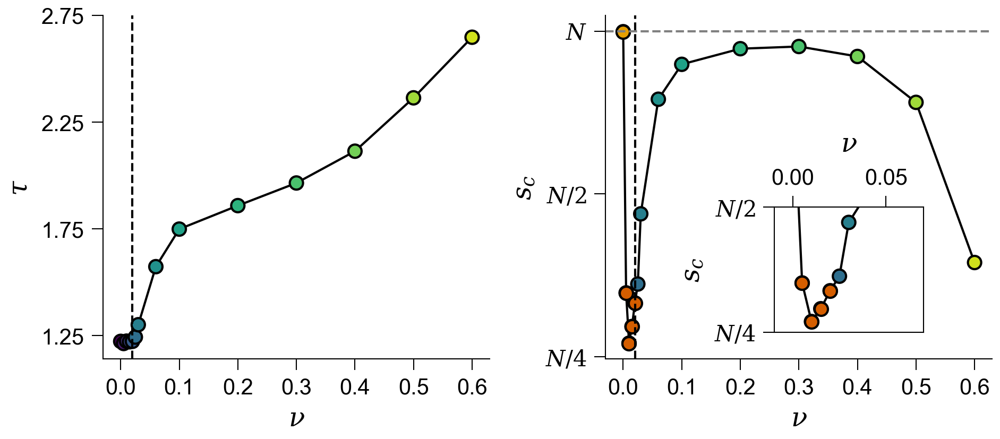

In [22]:
from matplotlib.ticker import FixedLocator, NullLocator
NCURVES = len(Tvar)
with plt.style.context(spstyle.get_style('thesis')):
    fig, (ax4, ax2) = plt.subplots(1,2, figsize=(7.2, 2.8))
    fig.subplots_adjust(wspace = 0.3)
    colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

    ################## Smax ##################
    ax2.scatter(Tvar, Tnonzero_s, c=colors, marker='o', zorder=2)
    ax2.scatter(Tvar[0], Tnonzero_s[0], c=color_list[2], marker='o', zorder=2)
    ax2.scatter(Tvar[1:5], Tnonzero_s[1:5], c=color_list[3], marker='o', zorder=2)
    
    ax2.plot(Tvar, Tnonzero_s, '-', c = 'k', zorder=1)
    ax2.axvline(Tvar[4], ls = '--', c = 'k', label = "{} = {}".format(macros['diss'], Tvar[2]))
    ax2.axhline(L1 * L2, c = "grey", ls = '--')
    ax2.xaxis.set_visible(True)
    ax2.set_xlabel(r'$\nu$')
    ax2.set_ylabel(r'$s_{c}$')
    ax2.set_yscale('log')
    
    N = L1*L2
    yticks = [N, N/2, N/4]
    ax2.yaxis.set_major_locator(FixedLocator(yticks))  # Supprime tous les autres ticks majeurs
    ax2.yaxis.set_minor_locator(NullLocator())  # Supprime les ticks mineurs
    ax2.set_yticklabels([r'$N$', r'$N / 2$', r'$N / 4$'])
    ax2.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])

    ax22 = fig.add_axes([0.71, 0.17, 0.13, 0.28])
    ax22.scatter(Tvar, Tnonzero_s, c=colors, marker='o', zorder=2)
    ax22.plot(Tvar, Tnonzero_s, '-', c = 'k', zorder=1)
    
    ax22.scatter(Tvar[0], Tnonzero_s[0], c=color_list[2], marker='o', zorder=2)
    ax22.scatter(Tvar[1:5], Tnonzero_s[1:5], c=color_list[3], marker='o', zorder=2)
    
    
    ax22.set_xlim(-0.01,0.07)
    ax22.set_ylim(N/4,2*N/4)
    ax22.xaxis.set_label_coords(-0.5, 1.6) 
    ax22.xaxis.set_ticks_position('top')
    
    ax22.spines['top'].set_visible(True)
    ax22.spines['right'].set_visible(True)
    ax22.set_xlabel(r'$\nu$')
    ax22.set_ylabel(r'$s_{c}$')
    ax22.set_yscale('log')
    ax22.yaxis.set_major_locator(FixedLocator(yticks))  # Supprime tous les autres ticks majeurs
    ax22.yaxis.set_minor_locator(NullLocator())  # Supprime les ticks mineurs
    ax22.set_yticklabels([r'$N$', r'$N / 2$', r'$N / 4$'])


    ################## Exposant ##################
    ax4.scatter(Tvar, -Ttau_s, c = colors, zorder=2, marker = 'o')
    # ax4.errorbar(Tvar, -Ttau_s, yerr = Tperr_s)
    ax4.plot(Tvar, -Ttau_s, linestyle = '-', c = 'k', zorder=1)
           
    ax4.axvline(Tvar[4], linestyle = '--', c = 'k', label = '{}'.format(Tvar[3]))
    ax4.set_xticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6])
    ax4.set_xlabel(r'$\nu$')
    ax4.set_ylabel(r'$\tau$')
    ax4.set_yticks([1.25, 1.75 ,2.25, 2.75])

    


 

    # plt.savefig("Fig2_1.pdf",  bbox_inches='tight', dpi = 300)
    plt.show()


#   P(s_c)

In [8]:
def count_lines_gz_safe(filename, csize = 1000):
    count = 0
    chunk_size = csize 
    try:
        with gzip.open(filename, 'rb') as f:
            leftover = b''
            while True:
                chunk = f.read(chunk_size)
                if not chunk:
                    break
                lines = (leftover + chunk).split(b'\n')
                leftover = lines.pop()  # dernière ligne peut être tronquée
                count += len(lines)
            if leftover:
                count += 1  # compte la dernière ligne même si tronquée
    except EOFError:
        # fichier tronqué, on arrête là et on retourne le compte
        pass
    return count

def process_parallel_load(foldernb, nb = [1,2,3,4,5,6,7,8,9], chunksize = 1e6, L = 64, limdata = 1e6, cols = [12], nbins = 50):

    # logbins_s = np.logspace(np.log(1), np.log(L**2), nbins)
    # histo_s = np.zeros(len(logbins_s)-1)
    bins_s = np.arange(0, L**2)
    histo_s = np.zeros(len(bins_s)-1)
    
    logbins_a = np.logspace(np.log(1/L**2), np.log(1), nbins)
    histo_a = np.zeros(len(logbins_a)-1)
    for i in nb:
        file = "/data1/DATA_Duplat/Brut/Memory_effects/Me{}n{}/random_random.gz".format(foldernb,i)
        if chunksize >= 1e5:
            nblines = 0
            
            for chunk in chunked_file_reader(file, chunksize = chunksize, usecols=cols):
                # histo_s += np.histogram(chunk.iloc[:, 0], bins = logbins_s)[0]
                histo_s += np.histogram(chunk.iloc[:, 0], bins = bins_s)[0]
                histo_a += np.histogram(1/chunk.iloc[:, 0], bins = logbins_a)[0]
                
                nblines += len(chunk)
            
                if nblines >= limdata:
                    break
                
        if chunksize < 1e5:
            with gzip.open(file, "rt") as f:
                for i, line in enumerate(f):
                    if line.startswith("#"):
                        continue
                    
                    s= int(float(line.strip().split()[cols[0]]))

                    # id = np.searchsorted(logbins_s, s, side='right') -1
                    # histo_s[id] += 1
                    histo_s[s] +=1
                    
                    id = np.searchsorted(logbins_a, 1/s, side='left') - 1
                    histo_a[id] += 1
                    
                    if i >= limdata:
                        break
        
    logbins_s, loghisto_s = new_logbins(histo_s, nbins)
    
    # log_histo, log_bins = loghisto(histo_s)
    # norm_histo_s = loghisto_s/((np.diff(logbins_s)) * np.sum(loghisto_s))
    norm_histo_a = histo_a/((np.diff(logbins_a)) * np.sum(histo_a))
    
    # return logbins_s, norm_histo_s, logbins_a, norm_histo_a
    return logbins_s, loghisto_s, logbins_a, norm_histo_a

def floor_sig(x, n=1): #Pour récupére le floor de la valeur
    p = int(np.floor(np.log10(abs(x))))
    fact = 10 ** (p - n + 1)
    return int(np.floor(x / fact) * fact)

def count_lines(Tfolder_nb, nbfolder):
    
    for j, nb in enumerate(Tfolder_nb):
        project =  "/data1/DATA_Duplat/Brut/Memory_effects/Me{}".format(nb)
        min = 1e10
        print(nb)
        for i in range(1,nbfolder+1):
            file = "{}n{}/random_random.gz".format(project, i)
            nbl = count_lines_gz_safe(file)
            print (nbl)
            if nbl < min:
                min = nbl
        print(min)
        
def full_analysis(Tfolder_nb,  nbins = 50, cols = [12], nbfolder = [1,2,3,4,5,6,7,8,9]): #To sum different realisation in the same project
    Tnbline = [None]*len(Tfolder_nb)
    Tnu = [None]*len(Tfolder_nb)
    TL = [None]*len(Tfolder_nb)
    
    f_log_histo = []
    f_bin_centers_s = []
    f_bin_centers_a = []
    f_norm_histo_a = []

    
    for j, nb in enumerate(Tfolder_nb):
        project =  "/data1/DATA_Duplat/Brut/Memory_effects/Me{}".format(nb)
        Tnu[j] = read_parameters("{}n1".format(project))[2]
        TL[j] = read_parameters("{}n1".format(project))[0]
        
        min = 1e10
        for i in nbfolder:
            file = "{}n{}/random_random.gz".format(project, i)
            nbl = floor_sig(count_lines_gz_safe(file), 2)
            if nbl < min:
                min = nbl
        print(min)
        Tnbline[j] = min
        
    results = Parallel(n_jobs=-1)(delayed(process_parallel_load)(nb, nbfolder, nbline/10, L, nbline, cols = cols, nbins = nbins)
                                    for (nb, L, nbline) in zip(Tfolder_nb, TL, Tnbline))
    
    for i, (bins_s, histo_s, bins_a, hist_a) in enumerate(results):
        
        bin_centers_s = (bins_s[:-1] + bins_s[1:])/2
        bin_centers_a = (bins_a[:-1] + bins_a[1:])/2
    
        mask = histo_s !=0
        f_bin_centers_s.append(bin_centers_s[mask])
        f_log_histo.append(histo_s[mask])
    
        mask = hist_a!=0
        f_bin_centers_a.append(bin_centers_a[mask])
        f_norm_histo_a.append(hist_a[mask])
    
    return f_bin_centers_s, f_log_histo, f_bin_centers_a,f_norm_histo_a
    
def gamma_th():

    fnb = np.arange(1,15)
    folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
    """ folderpath = np.insert(folderpath, 8, '/data1/DATA_Duplat/Brut/PDF/PD8n1') """
    Tvar = [read_parameters(folder)[2] for folder in folderpath]

    results = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder))
                                                                        for  folder in folderpath)
    Thisto_s, Tbins_s, _, _, _ = zip(*results)

    Tstart_x = [2,4,4,4,1,0,1,3,5,4,4,8,8,8]
    Tstop_x = [4.e3, 1.1e4, 9e3, 8e3, 6e3, 1e3, 1e3, 1e4, 2.5e4, 4e4, 4.6e4, 1e4, 1e4, 5e3, 3.8e3]
    _, _, Ttau_s, _ = PDF_fitting(Thisto_s, Tbins_s, Tstart_x, Tstop_x, Tvar)
    
    gamma = (-Ttau_s) - (-Ttau_s[0]) - 1
    
    return Tvar, gamma, -Ttau_s
    

def log_exppowlaw(x, a, b, c):
    return np.log(a)-b*np.log(x)-x/c


In [9]:
Tfolder_nb = [77,78,79,80,81,83, 82]
Tbin_s1, Thisto_s1, Tbin_a1, Thisto_a1 = full_analysis(Tfolder_nb, nbfolder = [2,3,4,5,6,7,8,9], nbins = 50, cols =[12])

36000
360000
390000
380000
360000
290000
340000


In [10]:
Tnu_th, Tgamma_th, Ttau_s_th = gamma_th()

0.96545763582405
0.9971726928826957
0.9940950079772213
0.9970879131270517
0.9967105205796035
0.9906659255469019
0.9877020531728582
0.9272213838997168
0.9122521887346848
0.9705872766834267
0.9174095398449836
0.9057453446744788
0.8991641398725068
0.8933054895985362


/tmp/ipykernel_2448862/268303998.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]


/home/kduplat/Documents/py38/lib/python3.8/site-packages/sciplotlib/stylesheets/thesis.mplstyle


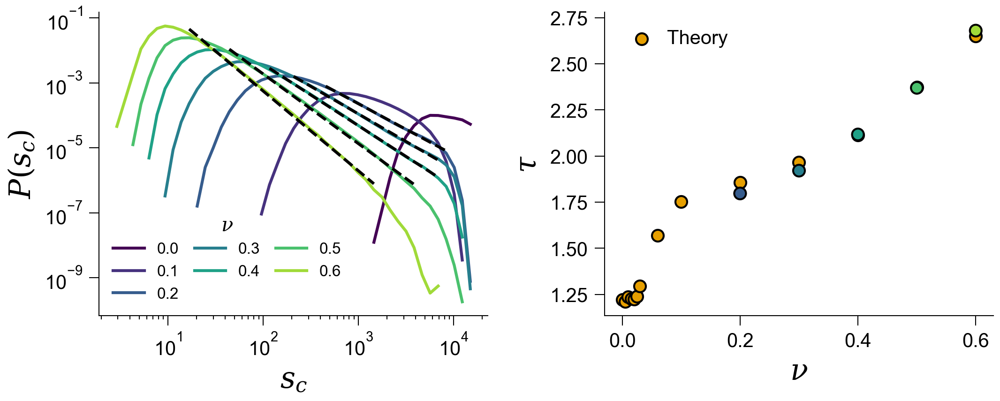

In [15]:
import warnings
from matplotlib.ticker import FixedLocator, NullLocator
from mpl_toolkits.axisartist.axislines import SubplotZero

warnings.resetwarnings()

Tnu = [0.0, 0.1, 0.2, 0.3 ,0.4, 0.5, 0.6]
Tn_try = [1]*len(Tnu)
Tstop = [1e4, 6e3, 1.2e4, 1e4, 1e4, 5e3, 2e3]
Tstart = [1000, 1e3, 400, 200, 100, 40, 15]
Tphi = [None]*len(Tnu)
Tperr = [None]*len(Tnu)
NCURVES = len(Tnu)
Tcolor = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

max_nbtry = 6554

warnings.filterwarnings("error")
with plt.style.context(spstyle.get_style('thesis')):
    print(spstyle.get_style('thesis'))

    fig, (ax2,ax1) = plt.subplots(1,2,figsize=(8.2, 2.8))
    fig.subplots_adjust(wspace = 0.3)
    
    
    ######P(smax)######
    for j, n in enumerate(Tnu):
        ax2.plot(Tbin_s1[j], Thisto_s1[j], c = Tcolor[j], label = f"{Tnu[j]}", lw =1.5)
        if j not in [0, 1]:
            start = np.where(Tbin_s1[j] >= Tstart[j])[0][0]
            stop = np.where(Tbin_s1[j] <= Tstop[j])[0][-1]
            popt, pcov = curve_fit(powerlaw2, np.log(Tbin_s1[j][start:stop]), np.log(Thisto_s1[j][start:stop]), p0 = [0.5, 1.6], maxfev = 1000)
            Tperr[j] = np.sqrt(np.diag(pcov))[1]
            Tphi[j] = popt[1]
            yfit = np.exp(powerlaw2(np.log(Tbin_s1[j][start:stop]), *popt))
            ax2.plot(Tbin_s1[j][start:stop], yfit, ls = '--', c ='k', lw =1.5)

    
    # ax1.scatter(Tnu_th, 2-(-Tgamma_th), c = color_list[2], label = r'Theory')
    # ax1.errorbar(Tnu[2:], -np.array(Tphi)[2:], yerr = Tperr[2:], c = 'k', ls = ' ')
    # ax1.scatter(Tnu[2:], -np.array(Tphi)[2:], c = Tcolor[2:], zorder = 2)
    
    ax1.scatter(Tnu_th, Ttau_s_th, c = color_list[2], label = r'Theory')
    ax1.errorbar(Tnu[2:], -np.array(Tphi)[2:]+Ttau_s_th[0]-1, yerr = Tperr[2:], c = 'k', ls = ' ')
    ax1.scatter(Tnu[2:], -np.array(Tphi)[2:]+Ttau_s_th[0]-1, c = Tcolor[2:], zorder = 2)

    ax1.set_ylabel(r"$\tau$", fontsize = 15)
    ax1.set_xlabel(r"$\nu$", fontsize = 15)
    ax1.legend(fontsize = 10, handletextpad=0.3)
    
    ax2.set_xlabel(r"$s_c$", fontsize = 15)
    ax2.set_ylabel(r"$P(s_c)$", fontsize = 15)
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.legend(title = r"$\nu$", ncol = 3, columnspacing=1.0)


    
    fig.patch.set_alpha(0.0)

    ax1.patch.set_alpha(0.0)
    ax2.patch.set_alpha(0.0)
    fig.savefig('Fig8.pdf', bbox_inches = 'tight', dpi = 600)
    plt.show() 
    
warnings.resetwarnings()

#   Otsu

In [ ]:
def class_contrast(image, thresholds):
    regions = np.digitize(image, bins=thresholds)
    means = [np.mean(image[regions == i]) for i in range(len(thresholds) + 1)]
    contrast = np.std(means)  # Dispersion des moyennes
    return contrast

def otsu_criterion(image, thresholds):
    """
    Calcule la variance intra-classe totale après seuillage multi-Otsu.
    Plus cette valeur est faible, meilleure est la séparation des classes.
    """
    regions = np.digitize(image, bins=thresholds)
    total_variance = 0
    
    for i in range(len(thresholds) + 1):
        mask = regions == i
        if np.any(mask):
            variance = np.var(image[mask])
            total_variance += variance
    
    return total_variance


from matplotlib.path import Path
def otsu_detection(nbclasse, image, m_size, sigma_X, sigma_Y, mode_switch, min_nbclass = 2):
    max_interclasse = 0
    min_intraclasse = 1e12
    max_nbclasse = 0
    
    """ blurred_image = cv2.GaussianBlur(image, (m_size, m_size), sigmaX = sigma_X, sigmaY = sigma_Y) """
    blurred_image  = cv2.medianBlur(image, 5)
    
    #Find the best number of classes
    for n in range(min_nbclass, nbclasse + 1):
        thresholds = threshold_multiotsu(blurred_image[image!=0], classes = n)
        if mode_switch == 0:
            contrast = class_contrast(image, thresholds)
            if contrast > max_interclasse:
                max_interclasse = contrast
                max_nbclasse = n
                
        elif mode_switch == 1:
            intra_std = otsu_criterion(image, thresholds)
            if intra_std < min_intraclasse:
                min_intraclasse = intra_std
                max_nbclasse = n
        else:
            raise ValueError("otsu_detection mode_switch must be 0 or 1")
    # max_nbclasse = 5
    return cluster_detection(blurred_image, max_nbclasse)

def contours_to_label_fct(labeled_image, contours, num_features):
    L1 = labeled_image.shape[0]
    L2 = labeled_image.shape[1]
    ##########External contour##########
    contour_to_label = []
    for j, contour in enumerate(contours):  
        external_path = Path(contour)
        for k in range(1,num_features + 1):
            patch = np.argwhere(labeled_image == k)
            inside = external_path.contains_points(patch)
            if np.any(inside): #Au moins un élément dans être contenu dans le contour
                contour_to_label.append([j, k])
                # ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="red", alpha=1)
                break
        else: 
            contour_to_label.append([j, -1]) #Si aucun élément n'est contenu dans le contour, c'est un contour interieur    
            # ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="blue", alpha=1)  

    ##########Internal contour##########
    contour_to_label = np.array(contour_to_label)
    mask = contour_to_label[:,1] == -1

    for _, int_id_contour in enumerate(contour_to_label[mask][:,0]):
        for _, (id_contour, idpatch) in enumerate(contour_to_label[~mask]):
            external_path = Path(contours[id_contour])
            inside = external_path.contains_points(contours[int_id_contour])
            if np.any(inside): #Au moins un élément dans être contenu dans le contour
                contour_to_label[int_id_contour,1] = idpatch 
                # ax.plot(contours[int_id_contour][:, 1], contours[int_id_contour][:, 0], linewidth=2, color="green", alpha=1)
                break
        else:
            for point in contours[int_id_contour]:
                y, x = np.floor(point).astype(int)

                neighbors = [(y+1, x), (y-1, x), (y, x+1), (y, x-1)]
                for y_neighbor, x_neighbor in neighbors: 
                    if 0 <= x_neighbor < L1 and 0 <= y_neighbor < L2:
                        label_val = labeled_image[y_neighbor, x_neighbor]
                        if label_val:
                            contour_to_label[int_id_contour, 1] = label_val
                            break

                    
        if contour_to_label[int_id_contour,1] == -1:
            print("A contour is not linked to a cluster, id_contour = {}".format(int_id_contour))
        """     ax.plot(contours[int_id_contour][:, 1], contours[int_id_contour][:, 0], linewidth=3, color="orange", alpha=1)
        else :
            ax.plot(contours[int_id_contour][:, 1], contours[int_id_contour][:, 0], linewidth=3, color="green", alpha=1) """
    
    #Change the contour_id to the patch_id since it will be the same in all_contours_to_label and all_contours 
    return contour_to_label


def cluster_detection(blurred_image, nbclass):
    feature_areas = []
    all_contours = []
    all_labeled_image = []
    
    thresholds = threshold_multiotsu(blurred_image[blurred_image!=0], classes = nbclass)#Find the thresholds
    regions = np.digitize(blurred_image, bins=thresholds)
    all_contours_to_label = []
    
    for i in range (0, nbclass):
        # print(i)
        mask = regions == i  # Tolérance pour ignorer uniquement les valeurs très faibles
        masked_image = np.where(mask, 1, -1)

        smoothed_image = filters.gaussian(masked_image, sigma=1) #Allow to fill the possible holes in the clusters
        
        original = smoothed_image
        thres = threshold_otsu(smoothed_image) #Find a threshold between background and the class
        binary = original > thres

        binary_closed = binary_closing(binary, structure=np.ones((2,2))) #Créé les domaines (dilatation + erosion)
        labeled_image, num_features = label(binary_closed)  #Etiquettes les regions 
        feature_areas.extend(np.bincount(labeled_image.ravel())[1:]) #Enregistre la taille de chaque regions (ravel aplati le tableau)
        all_labeled_image.append(labeled_image)

        contours = measure.find_contours(binary_closed, level=0.5)
        all_contours.extend(contours)
    
        ##########Link contours to labeled clusters##########

        contours_to_label = contours_to_label_fct(labeled_image, contours, num_features)
        contours_to_label[:,0] = i
        all_contours_to_label.extend(contours_to_label)  
    
    return np.array(feature_areas), np.array(all_contours, dtype = object), np.array(all_labeled_image), thresholds, np.array(all_contours_to_label)
           
                


In [ ]:
def process_detection(folderpath, nbclasse, nbsnap, nu, m_size = 3, sigma_X = 0, sigma_Y = 0, mode_switch = 0, nbins = 15):
    L1 = read_parameters(folderpath)[0]
    L2 = read_parameters(folderpath)[1]
    nu = read_parameters(folderpath)[2]

    lin_bins = np.arange(0, L1 * L2)
    logbins = np.logspace(np.log(1), np.log(L1*L2), nbins+1)
    histo = np.zeros(nbins)
    avg_width = 0

    
    
    elements = os.listdir("{}Snapshots/".format(folderpath))
    for element in elements[:nbsnap]:
        feature_areas2 = []
        all_contours2 = []
        all_labeled_image2 = []
        
        data = np.loadtxt("{}Snapshots/{}".format(folderpath,element), comments='#')
        sys = data.reshape(L1, L2).T
        sys_image_bis = (sys * 255).astype(np.uint8)  # Conversion en échelle de 0 à 255
        
        feature_areas, all_contours, all_labeled_image, thresholds, contour_to_label = otsu_detection(nbclasse, sys_image_bis, m_size, sigma_X, sigma_Y, mode_switch)
            
        if len(all_contours) > 600 and nu < 0.5:
            image = cv2.medianBlur(sys_image_bis, 5)            
            feature_areas, all_contours, all_labeled_image, thresholds, contour_to_label = otsu_detection(nbclasse, image, 7,0,0, mode_switch)
       
        
        histo += np.histogram(feature_areas, bins=logbins, density = True)[0]
        
    histo /= nbsnap 
    avg_width = avg_width / nbsnap
    return histo, avg_width


    

In [ ]:
def corrlen_fit_and_sum(data, ymin = 1e-2, xmin = 15, ixmax = 200, lenmin = 10):
    corrlen = np.zeros(len(data))
    const_fit = np.zeros_like(corrlen)
    corrlen_fit = np.zeros_like(corrlen)

    for i, line in enumerate(data):
        x = np.arange(L2//2)
        
        xmax = 0
        if len(np.argwhere(line[5:] <ymin) != 0) :
            xmax = np.argwhere(line[5:] <ymin)[0][0] 
        else:
            xmax = ixmax
        
        f_line = line[:xmax]
        f_y = x[:xmax]
        
        
        corrlen[i] = np.sum(f_line)
        
        const_fit[i], corrlen_fit[i] = corr_const_clen_fit(i, x, line, xmin, ymin)
    
    return corrlen, const_fit, corrlen_fit

def corr_const_clen_fit(i, x, y, xmin = 2, ymin = 1e-2):
    xmax = 0
    const = 0
    clen = 0
    
    if i > 5 & len(np.argwhere(y[xmin:] < ymin) != 0):
        xmax = np.argwhere(y[xmin:] < ymin)[0][0] 
        
        if xmax - xmin <3:
            return 0,0
            
        fy = y[xmin:xmax]
        fx = x[xmin:xmax]
        popt, pcov = curve_fit(expfct2, fx, np.log(fy))
        a, b = popt

        const = np.exp(a)
        clen = -1/b
        
    return const, clen

In [10]:
data = np.load("/home/kduplat/Documents/Data/Pscript2/Thesis_figures/ChapterPatches/Figure_otsu_open_brut.npz", allow_pickle=True)
Thisto = data["Thisto"]

data2 = np.load("/home/kduplat/Documents/Data/Pscript2/Thesis_figures/ChapterPatches/Figure_otsu_brut.npz", allow_pickle=True)
Thisto2 = data2["Thisto"]

In [25]:
print(len(data["Thisto"][0]))
print(np.sum(data["Thisto"][5]))

50
26682.0


/tmp/ipykernel_2593675/2569257917.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]
/tmp/ipykernel_2593675/2569257917.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors2 = [plt.cm.get_cmap('inferno')(i/NCURVES) for i in range(NCURVES)]
/tmp/ipykernel_2593675/2569257917.py:45: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the s

[-0.34311375  1.7344743 ]
0.06210934217238927
[-0.31296235  1.61872074]
0.05564255513856173


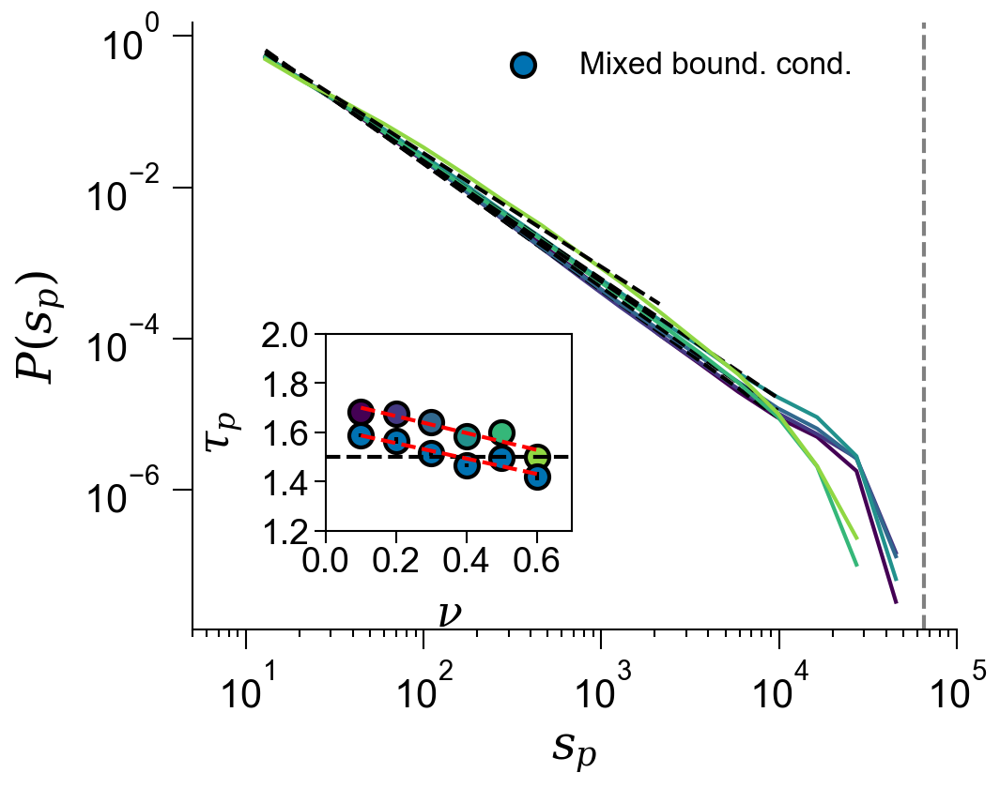

In [11]:
folderpaths = ["/data1/DATA_Duplat/Brut/Patch_detection/Pa1n{}/".format(nb) for nb in range(1, 7)]
Tnu = [read_parameters(folderpath)[2] for folderpath in folderpaths]
nbins = 50

Tnu = np.array([read_parameters(folderpath)[2] for folderpath in folderpaths])
L1 = read_parameters(folderpaths[0])[0]
L2 = read_parameters(folderpaths[0])[1]
NCURVES = len(Tnu)
colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]
colors2 = [plt.cm.get_cmap('inferno')(i/NCURVES) for i in range(NCURVES)]
log_bins = np.logspace(np.log(1), np.log(L1 * L2), nbins+1)
diff_bins = np.diff(log_bins)
Tb = np.zeros(len(Tnu))
xmin = 10
xmax = [20000, 20000, 20000, 20000, 4000, 4000]



with plt.style.context(spstyle.get_style('thesis')):

    fig, ax1 = plt.subplots(figsize=(3.5, 2.8))
    ax2 = fig.add_axes([0.26, 0.235, 0.25, 0.25])
    for j, (histo, x) in enumerate(zip(Thisto[:], Tnu[:])):
        
        histo = histo/diff_bins
        mask = histo != 0
        fhist = histo[mask]
        fbins = log_bins[:-1][mask]
        idmin = np.argwhere(fbins>=xmin)[0][0]
        idmax = np.argwhere(fbins<=xmax[j])[-1][0]
        nbpatch = np.sum(fhist[idmin:])
        
        xfit = fbins[idmin: idmax]
        popt,pcov = curve_fit(powerlaw2, np.log(xfit), np.log(fhist[idmin:idmax]/nbpatch))
        a, b = popt
        Tb[j] = -b
        yerr = np.sqrt(np.diag(pcov))[1]
        yfit = np.exp(powerlaw2(np.log(xfit), *popt))
        
        
        ax1.plot(fbins[idmin:],fhist[idmin:]/nbpatch, color = colors[j])
        ax1.plot(xfit, yfit, 'k--')
        ax2.errorbar(x, -np.round(b, 3), yerr = yerr, c = 'k')
        ax2.scatter(x, -np.round(b, 3), c = colors[j], zorder = 2)
        # leg2 = ax2.scatter(x, 2 - 1/(2*Tslope_pl[j]), c = color_list[2], label = "Theory")
        
        # print(b)
        # print(Tslope_pl[j])
        # ax2.errorbar(x, -np.round(result.x[1], 3), yerr = perr[1], fmt = 'o', color = colors[j])
        
        
    popt, pcov = curve_fit(linlaw, Tnu, Tb)
    print(popt)
    yerr = np.sqrt(np.diag(pcov))[0]
    print(yerr)
    yfit  = linlaw(Tnu, *popt)
    ax2.plot(Tnu, yfit, ls = '--', c = 'r')
        
    for j, (histo, x) in enumerate(zip(Thisto2[:], Tnu[:])):
        
        histo = histo/diff_bins
        mask = histo != 0
        fhist = histo[mask]
        fbins = log_bins[:-1][mask]
        idmin = np.argwhere(fbins>=xmin)[0][0]
        idmax = np.argwhere(fbins<=xmax[j])[-1][0]
        nbpatch = np.sum(fhist[idmin:])
        
        xfit = fbins[idmin: idmax]
        popt,pcov = curve_fit(powerlaw2, np.log(xfit), np.log(fhist[idmin:idmax]/nbpatch))
        a, b = popt
        Tb[j] = -b
        yerr = np.sqrt(np.diag(pcov))[1]
        yfit = np.exp(powerlaw2(np.log(xfit), *popt))
        
        
        # ax1.plot(fbins[idmin:],fhist[idmin:]/nbpatch, color = colors[j])
        # ax1.plot(xfit, yfit, 'k--')
        if j == 0:
            leg3 = ax2.scatter(x, -np.round(b, 3), c = color_list[0], zorder = 2, label = 'Mixed bound. cond.')
        else:
            ax2.scatter(x, -np.round(b, 3), c = color_list[0], zorder = 2)
        ax2.errorbar(x, -np.round(b, 3), yerr = yerr, c = 'k')
        
        # leg2 = ax2.scatter(x, 2 - 1/(2*Tslope_pl[j]), c = color_list[2], label = "Estimated exponent")
        
        # print(b)
        # print(Tslope_pl[j])
        # ax2.errorbar(x, -np.round(result.x[1], 3), yerr = perr[1], fmt = 'o', color = colors[j])
        
    ax2.axhline(1.5, ls = '--', c = 'k')

    popt, pcov = curve_fit(linlaw, Tnu, Tb)
    print(popt)
    yerr = np.sqrt(np.diag(pcov))[0]
    print(yerr)
    yfit  = linlaw(Tnu, *popt)
    ax2.plot(Tnu, yfit, ls = '--', c = 'r')
    
    ax1.axvline(L1*L2, ls ='--', c ='grey')
    # ax1.axvline(L1 * L2, ls = '--', c = 'k')
    ax1.set_xlabel(r'$s_p$')
    ax1.set_ylabel(r'$P(s_p)$')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(5,1e5)
    # ax1.set_ylim(1e-10,2e-2)
    ax2.set_xlabel(r"$\nu$", fontsize = 11)
    ax2.set_ylabel(r"$\tau_p$", fontsize = 11)
    ax2.set_ylim(1.2, 2)
    ax2.set_xlim(0, 0.7)
    ax2.set_xticks([0,0.2,0.4,0.6])
    ax2.set_yticks([1.2,1.4,1.6,1.8,2])
    ax2.tick_params(labelsize = 9, length = 3, pad = 1)
    ax2.spines['top'].set_visible(True)
    ax2.spines['right'].set_visible(True)
    
    ax1.legend(handles = [ leg3], bbox_to_anchor = (0.9,1))
    

    # plt.tight_layout()
    # ax.legend(fontsize = 20)
    # plt.savefig("P(s_p)_openbc.pdf", bbox_inches = 'tight', dpi = 300)
    plt.show()

#   Longueur de correlation

In [6]:
def corrlen_fit_and_sum(data, ymin = 1e-2, xmin = 15, ixmax = 200, lenmin = 10):
    corrlen = np.zeros(len(data))
    const_fit = np.zeros_like(corrlen)
    corrlen_fit = np.zeros_like(corrlen)

    for i, line in enumerate(data):
        x = np.arange(L2//2)
        
        xmax = 0
        if len(np.argwhere(line[5:] <ymin) != 0) :
            xmax = np.argwhere(line[5:] <ymin)[0][0] 
        else:
            xmax = ixmax
        
        f_line = line[:xmax]
        f_y = x[:xmax]
        
        
        corrlen[i] = np.sum(f_line)
        
        const_fit[i], corrlen_fit[i] = corr_const_clen_fit(i, x, line, xmin, ymin)
    
    return corrlen, const_fit, corrlen_fit

def corr_const_clen_fit(i, x, y, xmin = 2, ymin = 1e-2):
    xmax = 0
    const = 0
    clen = 0
    
    if i > 5 & len(np.argwhere(y[xmin:] < ymin) != 0):
        xmax = np.argwhere(y[xmin:] < ymin)[0][0] 
        
        if xmax - xmin <3:
            return 0,0
            
        fy = y[xmin:xmax]
        fx = x[xmin:xmax]
        popt, pcov = curve_fit(expfct2, fx, np.log(fy))
        a, b = popt

        const = np.exp(a)
        clen = -1/b
        
    return const, clen

/tmp/ipykernel_2593675/3613356313.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]
/tmp/ipykernel_2593675/3613356313.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax1.scatter(np.arange(0, L1//2), clen, label = nu, c = colors[j], s = 20)
/tmp/ipykernel_2593675/3613356313.py:49: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.

[-3.02026305  2.7250112 ]
[ 3.63712959 -8.25029998]


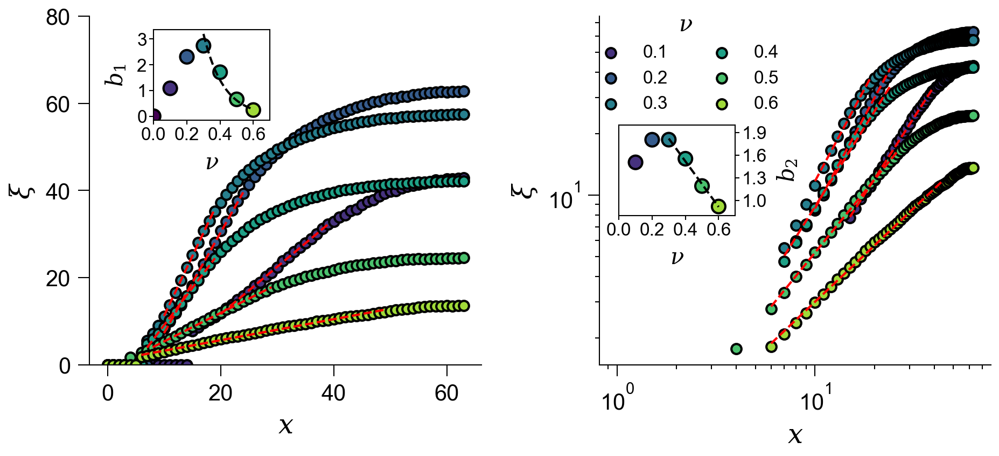

In [ ]:

Tfolderpath = ["/data1/DATA_Duplat/Brut/Space_distrib_and_corr/Sp10n{}".format(i) for i in range(1,8)]
Tnu = [read_parameters(folder)[2] for folder in Tfolderpath]
NCURVES = len(Tfolderpath)
colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

xminfit_lin = [20,10, 10, 7, 8,6]
xmaxfit_lin = [40,25, 20, 20, 30,50]
xminfit_log = [15,10, 10, 7, 6,6]
xmaxfit_log = [40,25, 20, 25, 27,45]

ixmin = [5, 5, 5, 5, 5, 2, 2]
iymin = [2e-2, 2e-2, 2e-2, 2e-2, 2e-2, 1e-2, 1e-2]

Tslope_pl = np.zeros(len(Tfolderpath))
Tslope_lin = np.zeros(len(Tfolderpath))

with plt.style.context(spstyle.get_style('thesis')): 
    
    fig, (ax1, ax2) = plt.subplots(1,2,figsize = (7.2, 2.8))
    ax3 =  fig.add_axes([0.58, 0.44, 0.1, 0.2])
    ax4 =  fig.add_axes([0.18, 0.65, 0.1, 0.2])
    fig.subplots_adjust(wspace = 0.3)
    for j, folder in enumerate(Tfolderpath):
        params = read_parameters(folder)
        L1 = params[0]
        L2 = params[1]
        nu = params[2]
        data = np.loadtxt("{}/tf_temp_outputB.txt".format(folder), comments = '#')
        data = data[:int(len(data)/2), :]
        
        
        
        if nu != 0.0:
            
            _, _, clen = corrlen_fit_and_sum(data, xmin = ixmin[j],ymin=iymin[j], lenmin = 3 )
            
            xfit_fit = np.arange(xminfit_lin[j-1], xmaxfit_lin[j-1] )
            popt, _ = curve_fit(linlaw, xfit_fit, clen[xminfit_lin[j-1]:xmaxfit_lin[j-1]])
            yfit_fit = linlaw(xfit_fit, *popt)
            Tslope_lin[j] = popt[0]
            ax1.scatter(np.arange(0, L1//2), clen, label = nu, c = colors[j], s = 20)
            ax1.plot(xfit_fit, yfit_fit, c = 'r', ls = '--')
            
            
            
            xfit_fit = np.arange(xminfit_log[j-1], xmaxfit_log[j-1] )
            popt, _ = curve_fit(powerlaw2, np.log(xfit_fit),np.log(clen[xminfit_log[j-1]:xmaxfit_log[j-1]]))
            yfit_fit = np.exp(powerlaw2(np.log(xfit_fit), *popt))
            ax2.scatter(np.arange(0, L1//2), clen, label = nu, c = colors[j], s = 20)
            ax2.plot(xfit_fit, yfit_fit, c = 'r', ls = '--')
            Tslope_pl[j] = popt[1]
            
    ax3.scatter(Tnu, Tslope_pl, c = colors)
    popt, _ = curve_fit(linlaw, Tnu[3:], Tslope_pl[3:])
    ax3.plot(Tnu[3:], linlaw(np.array(Tnu[3:]), *popt), ls = '--', c = 'k')
    print(popt)
    
    ax4.scatter(Tnu,Tslope_lin, c = colors)
    
    xfit = np.linspace(0.3,0.6, 100)
    popt, _ = curve_fit(expfct2, Tnu[3:], np.log(Tslope_lin[3:]))
    ax4.plot(xfit, np.exp(expfct2(xfit, *popt)), ls = '--', c = 'k')
    print(popt)
        
    ax1.set_xlabel(r'$x$')
    ax1.set_ylabel(r'$\xi$')
    ax1.set_ylim(0, 80)
    ax1.set_yticks([0,20,40,60,80])
    
    ax2.set_xlabel(r'$x$')
    ax2.set_ylabel(r'$\xi$')
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.tick_params(axis='x', which='minor', bottom=True)
    
    ax3.set_yticks([1,1.3,1.6,1.9])
    ax3.set_xticks([0,0.2,0.4,0.6])
    ax3.tick_params(labelsize = 8, length = 2, pad = 1)
    ax3.set_xlim(0,0.7)
    ax3.set_ylim(0.8, 2)
    ax3.set_xlabel(r"$\nu$", fontsize = 10)
    ax3.set_ylabel(r"$b_2$", fontsize = 10)
    ax3.spines['top'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    ax3.yaxis.tick_right()
    ax3.yaxis.set_label_position('right')
    
    
    ax4.set_xlabel(r"$\nu$", fontsize = 10)
    ax4.set_ylabel(r"$b_1$", fontsize = 10)
    ax4.set_xlim(0,0.7)
    # ax4.set_ylim(0.1, 5)
    ax4.set_yticks([0,1,2,3])
    ax4.set_xticks([0,0.2,0.4,0.6])
    ax4.spines['top'].set_visible(True)
    ax4.spines['right'].set_visible(True)
    ax4.tick_params(labelsize = 8, length = 2, pad = 1)
    # ax4.set_yscale('log')
    
    
    # ax1.legend(ncol = 2)
    ax2.legend(title = r"$\nu$", ncol = 2, bbox_to_anchor=(0.5, 1.05))
    #fig.savefig('Corrlen_x2.pdf', bbox_inches = 'tight', dpi = 300)
    plt.show()

    
    

/tmp/ipykernel_2593675/3684166242.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]
/tmp/ipykernel_2593675/3684166242.py:41: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax1.scatter(np.arange(0, L1//2), clen, label = nu, c = colors[j], s = 20)
/tmp/ipykernel_2593675/3684166242.py:49: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.

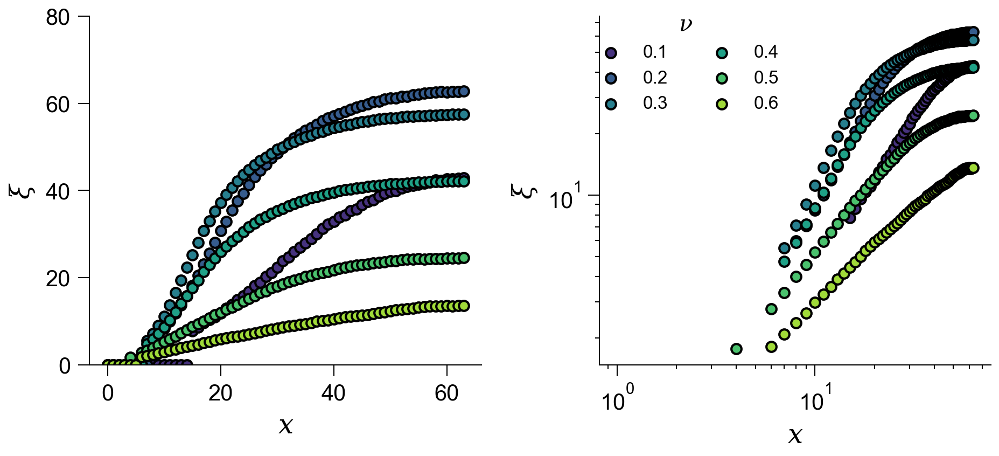

In [29]:

Tfolderpath = ["/data1/DATA_Duplat/Brut/Space_distrib_and_corr/Sp10n{}".format(i) for i in range(1,8)]
Tnu = [read_parameters(folder)[2] for folder in Tfolderpath]
NCURVES = len(Tfolderpath)
colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

xminfit_lin = [20,10, 10, 7, 8,6]
xmaxfit_lin = [40,25, 20, 20, 30,50]
xminfit_log = [15,10, 10, 7, 6,6]
xmaxfit_log = [40,25, 20, 25, 27,45]

ixmin = [5, 5, 5, 5, 5, 2, 2]
iymin = [2e-2, 2e-2, 2e-2, 2e-2, 2e-2, 1e-2, 1e-2]

Tslope_pl = np.zeros(len(Tfolderpath))
Tslope_lin = np.zeros(len(Tfolderpath))

with plt.style.context(spstyle.get_style('thesis')): 
    
    fig, (ax1, ax2) = plt.subplots(1,2,figsize = (7.2, 2.8))
    # ax3 =  fig.add_axes([0.58, 0.44, 0.1, 0.2])
    # ax4 =  fig.add_axes([0.18, 0.65, 0.1, 0.2])
    fig.subplots_adjust(wspace = 0.3)
    for j, folder in enumerate(Tfolderpath):
        params = read_parameters(folder)
        L1 = params[0]
        L2 = params[1]
        nu = params[2]
        data = np.loadtxt("{}/tf_temp_outputB.txt".format(folder), comments = '#')
        data = data[:int(len(data)/2), :]
        
        
        
        if nu != 0.0:
            
            _, _, clen = corrlen_fit_and_sum(data, xmin = ixmin[j],ymin=iymin[j], lenmin = 3 )
            
            xfit_fit = np.arange(xminfit_lin[j-1], xmaxfit_lin[j-1] )
            popt, _ = curve_fit(linlaw, xfit_fit, clen[xminfit_lin[j-1]:xmaxfit_lin[j-1]])
            yfit_fit = linlaw(xfit_fit, *popt)
            Tslope_lin[j] = popt[0]
            ax1.scatter(np.arange(0, L1//2), clen, label = nu, c = colors[j], s = 20)
            # ax1.plot(xfit_fit, yfit_fit, c = 'r', ls = '--')
            
            
            
            xfit_fit = np.arange(xminfit_log[j-1], xmaxfit_log[j-1] )
            popt, _ = curve_fit(powerlaw2, np.log(xfit_fit),np.log(clen[xminfit_log[j-1]:xmaxfit_log[j-1]]))
            yfit_fit = np.exp(powerlaw2(np.log(xfit_fit), *popt))
            ax2.scatter(np.arange(0, L1//2), clen, label = nu, c = colors[j], s = 20)
            # ax2.plot(xfit_fit, yfit_fit, c = 'r', ls = '--')
            Tslope_pl[j] = popt[1]
            
    # ax3.scatter(Tnu, Tslope_pl, c = colors)
    # popt, _ = curve_fit(linlaw, Tnu[3:], Tslope_pl[3:])
    # ax3.plot(Tnu[3:], linlaw(np.array(Tnu[3:]), *popt), ls = '--', c = 'k')
    # print(popt)
    
    # ax4.scatter(Tnu,Tslope_lin, c = colors)
    
    # xfit = np.linspace(0.3,0.6, 100)
    # popt, _ = curve_fit(expfct2, Tnu[3:], np.log(Tslope_lin[3:]))
    # ax4.plot(xfit, np.exp(expfct2(xfit, *popt)), ls = '--', c = 'k')
    # print(popt)
        
    ax1.set_xlabel(r'$x$')
    ax1.set_ylabel(r'$\xi$')
    ax1.set_ylim(0, 80)
    ax1.set_yticks([0,20,40,60,80])
    
    ax2.set_xlabel(r'$x$')
    ax2.set_ylabel(r'$\xi$')
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.tick_params(axis='x', which='minor', bottom=True)
    
    ax3.set_yticks([1,1.3,1.6,1.9])
    # ax3.set_xticks([0,0.2,0.4,0.6])
    # ax3.tick_params(labelsize = 8, length = 2, pad = 1)
    # ax3.set_xlim(0,0.7)
    # ax3.set_ylim(0.8, 2)
    # ax3.set_xlabel(r"$\nu$", fontsize = 10)
    # ax3.set_ylabel(r"$b_2$", fontsize = 10)
    # ax3.spines['top'].set_visible(True)
    # ax3.spines['right'].set_visible(True)
    # ax3.yaxis.tick_right()
    # ax3.yaxis.set_label_position('right')
    
    
    # ax4.set_xlabel(r"$\nu$", fontsize = 10)
    # ax4.set_ylabel(r"$b_1$", fontsize = 10)
    # ax4.set_xlim(0,0.7)
    # # ax4.set_ylim(0.1, 5)
    # ax4.set_yticks([0,1,2,3])
    # ax4.set_xticks([0,0.2,0.4,0.6])
    # ax4.spines['top'].set_visible(True)
    # ax4.spines['right'].set_visible(True)
    # ax4.tick_params(labelsize = 8, length = 2, pad = 1)
    # # ax4.set_yscale('log')
    
    
    # ax1.legend(ncol = 2)
    ax2.legend(title = r"$\nu$", ncol = 2, bbox_to_anchor=(0.5, 1.05))
    fig.savefig('Corrlen_x2.pdf', bbox_inches = 'tight', dpi = 300)
    plt.show()

    
    

# Beta

In [2]:

fnb = np.arange(1,15)
folderpath = [f'/data1/DATA_Duplat/Brut/PDF/PD5n{nb}' for nb in fnb]
Tvar = [read_parameters(folder)[2] for folder in folderpath]

L1 = read_parameters("/data1/DATA_Duplat/Brut/PDF/PD5n1")[0]
L2 = read_parameters("/data1/DATA_Duplat/Brut/PDF/PD5n1")[1]

results_s = Parallel(n_jobs=-1)(delayed(new_PDF)("{}/stat_histosize.txt".format(folder))
                                                                    for  folder in folderpath)

Thisto_s, Tbins_s, Tnonzero_s, Tmean_s,Tnbins_s = zip(*results_s)

Tstart_x = [2,2,2,4,1,0,1,3,5,4,4,8,8,8]
Tstop_x = [4.e3, 1.1e4, 9e3, 8e3, 6e3, 1e3, 1e3, 1e4, 2.5e4, 4e4, 4.6e4, 1e4, 1e4, 5e3, 3.8e3]

Txfit_s, Tyfit_s, Ttau_s, Tperr_s = PDF_fitting(Thisto_s, Tbins_s, Tstart_x, Tstop_x, Tvar)

0.96545763582405
0.9950241316250408
0.9912114549630819
0.9970879131270517
0.9967105205796035
0.9906659255469019
0.9877020531728582
0.9272213838997168
0.9122521887346848
0.9705872766834267
0.9174095398449836
0.9057453446744788
0.8991641398725068
0.8933054895985362


In [3]:
kappa = -1.9
beta = -1/(2*(-(Ttau_s) - (-Ttau_s[0]) - 1 + kappa/2))

print(beta)

[0.25641026 0.25510521 0.25707908 0.25703177 0.25667983 0.25861181
 0.26639682 0.31198777 0.35210428 0.37998084 0.41446665 0.47289362
 0.62485844 0.95637697]


In [4]:
def make_powerlaw_fixed(b):
    return lambda x,x0, a: a* (x-x0)**b

/tmp/ipykernel_2939140/2111573630.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]
/tmp/ipykernel_2939140/2111573630.py:35: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax2.scatter(np.arange(0, L1//2), clen, label = nu, c = colors[j], s = 50)
/tmp/ipykernel_2939140/962095282.py:2: RuntimeWarning: invalid value encountered in power
  return lambda x,x0, a: a* (x-x0)**b


0.3799808389977871
[ 9.95336265 14.73866246]
0.4144666539738945
[ 8.41239973 12.38131982]
0.4728936203109276
[6.51872494 7.0974647 ]
0.6248584365736001
[3.8215491  2.15580647]
0.9563769654602678
[-6.5180729   0.25642586]


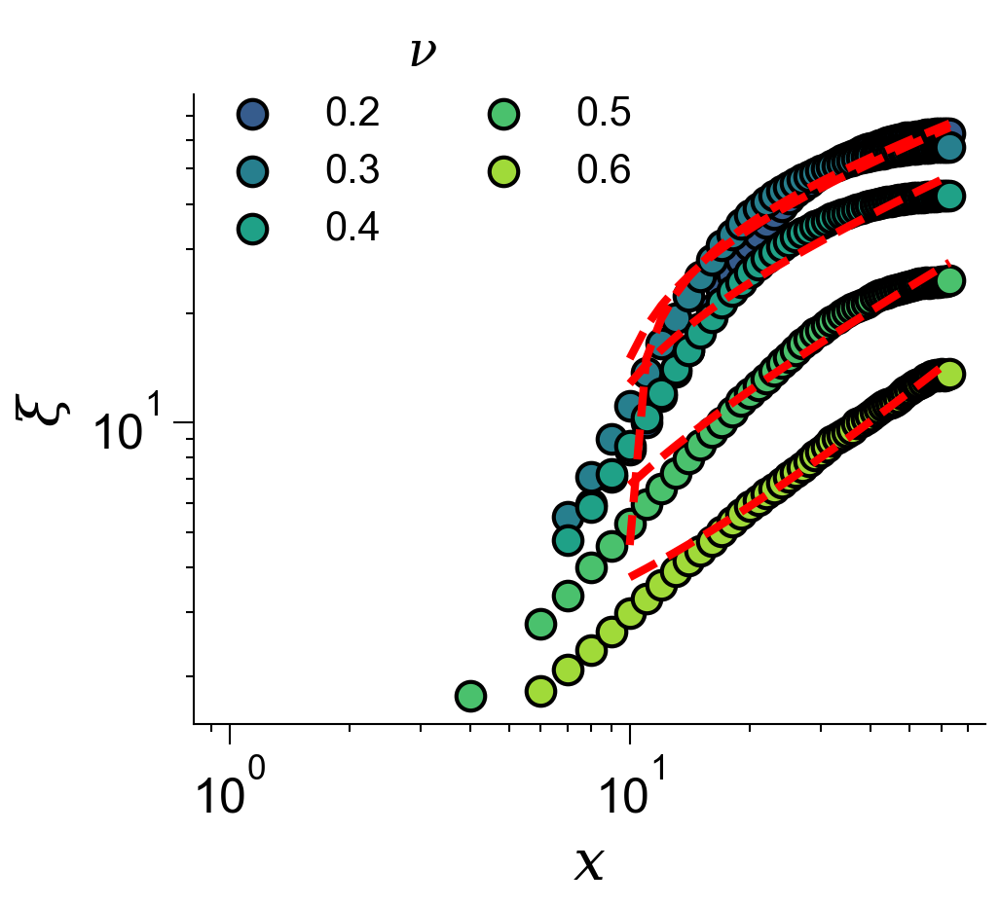

In [9]:

Tfolderpath = ["/data1/DATA_Duplat/Brut/Space_distrib_and_corr/Sp10n{}".format(i) for i in range(1,8)]
Tnu = [read_parameters(folder)[2] for folder in Tfolderpath]
NCURVES = len(Tfolderpath)
colors = [plt.cm.get_cmap('viridis')(i/NCURVES) for i in range(NCURVES)]

xminfit_lin = [20,10, 10, 7, 8,6]
xmaxfit_lin = [40,25, 20, 20, 30,50]
xminfit_log = [15,10, 10, 7, 6,6]
xmaxfit_log = [40,25, 20, 25, 27,45]

ixmin = [5, 5, 5, 5, 5, 2, 2]
iymin = [2e-2, 2e-2, 2e-2, 2e-2, 2e-2, 1e-2, 1e-2]

Tslope_pl = np.zeros(len(Tfolderpath))
Tslope_lin = np.zeros(len(Tfolderpath))

# b_values =[.185, 0.2, 0.23, 0.4, 1]
# b_values =[.37, 0.4, 0.46, 0.6, 1]
b_values = beta[-5:]

with plt.style.context(spstyle.get_style('thesis')): 
    
    fig, (ax2) = plt.subplots(figsize = (3.5, 2.8))
    fig.subplots_adjust(wspace = 0.3)
    for j, folder in enumerate(Tfolderpath):
        params = read_parameters(folder)
        L1 = params[0]
        L2 = params[1]
        nu = params[2]
        data = np.loadtxt("{}/tf_temp_outputB.txt".format(folder), comments = '#')
        data = data[:int(len(data)/2), :]
        
        if nu >= 0.2:
            _, _, clen = corrlen_fit_and_sum(data, xmin = ixmin[j],ymin=iymin[j], lenmin = 3 )
            ax2.scatter(np.arange(0, L1//2), clen, label = nu, c = colors[j], s = 50)
            print(b_values[j-2])
            powerlaw_fixed = make_powerlaw_fixed(b_values[j-2])
            xmin = 10
            xmax = 64
            xfit_fit = np.arange(xmin, xmax)
            
            popt, _ = curve_fit(powerlaw_fixed, xfit_fit, clen[xmin:xmax])
            yfit_fit =  powerlaw_fixed(xfit_fit, *popt)
            print(popt)
            
            ax2.plot(xfit_fit, yfit_fit, c = 'r', ls = '--', lw = 2)

    
    ax2.set_xlabel(r'$x$', fontsize = 14)
    ax2.set_ylabel(r'$\xi$', fontsize = 14)
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.tick_params(axis='x', which='minor', bottom=True)
    ax2.tick_params(labelsize = 12)
    
    # ax1.legend(ncol = 2)
    ax2.legend(title = r"$\nu$", ncol = 2, bbox_to_anchor=(0.6, 0.7), fontsize = 10, title_fontsize = 12)
    # fig.savefig('Corrlen_x2_th.pdf', bbox_inches = 'tight', dpi = 300)
    plt.show()

    
    

In [ ]:
def make_powerlaw_fixed(b):
    return lambda x,x0, a: a* (x-x0)**b

#   Réseau de bethe

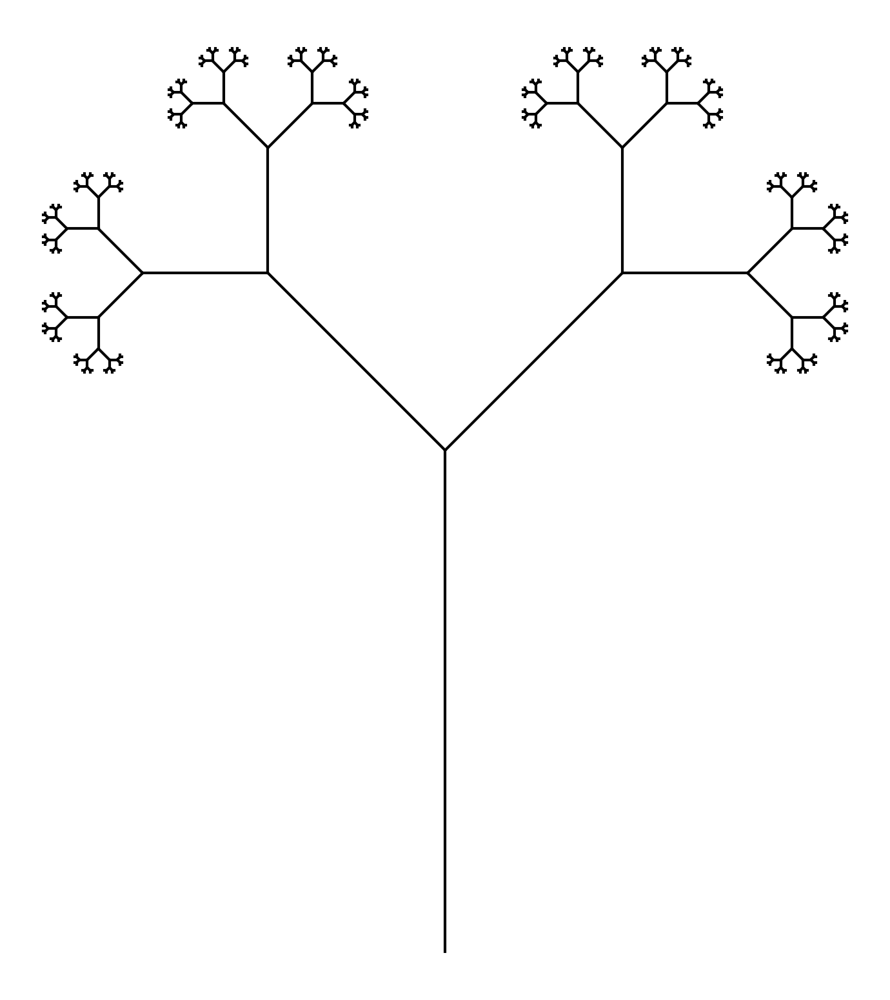

In [27]:
import numpy as np
import matplotlib.pyplot as plt

def bethe_tree(ax, x, y, length, angle, generation, max_generation):
    if generation > max_generation:
        return

    # Deux nouvelles branches
    for sign in [-1, 1]:
        new_angle = angle + sign * np.pi / 4

        x2 = x + length * np.cos(new_angle)
        y2 = y + length * np.sin(new_angle)

        ax.plot([x, x2], [y, y2], c='k', lw=3)

        bethe_tree(
            ax,
            x2,
            y2,
            length / 2,          # longueur divisée par 2
            new_angle,
            generation + 1,
            max_generation
        )


fig, ax = plt.subplots(figsize=(20, 20))


x0 = 0
x1 = 0
y0 = 0
y1 = -4
ax.plot([x0, x1], [y0, y1], c='k', lw=3)

bethe_tree(
    ax,
    x=0,
    y=0,
    length=2,
    angle=np.pi / 2,
    generation=1,
    max_generation=8
)

ax.set_aspect('equal')
ax.axis('off')

plt.show()

# Vue en coupe

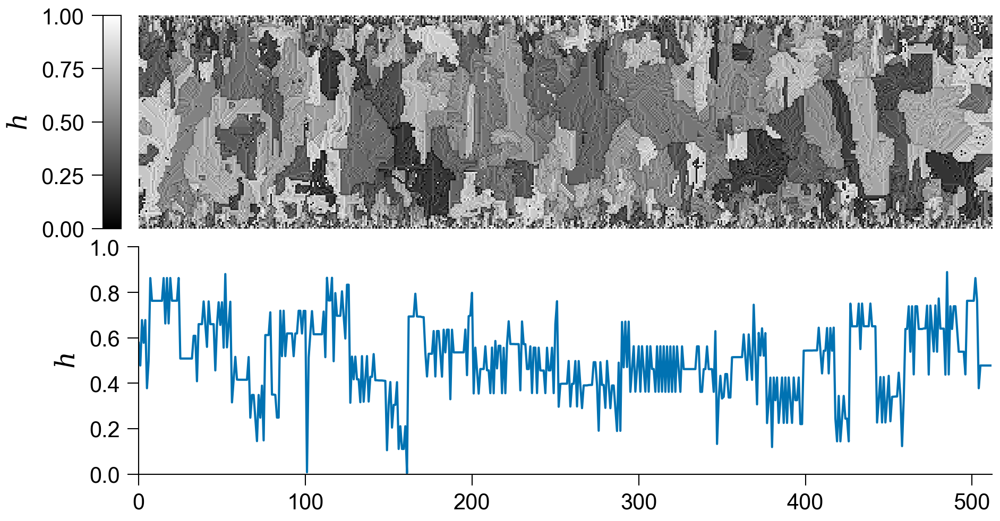

In [28]:
file ="/data1/DATA_Duplat/Brut/Configurations/Co38n7/Snapshots/nav20000000000_outputB.txt"
L1 = 128
L2 = 512
    
with plt.style.context(spstyle.get_style('thesis')):
    # Create figure and subplots at once
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7.2, 3.8))
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    
    sys = np.loadtxt(file, comments='#').reshape(L2, L1).T

    pos = ax1.imshow(1-sys, cmap="gray", vmin = 0, vmax = 1)
    ax2.plot(1-sys[64], c = color_list[0])
    
    ax1.set_axis_off()
    ax2.set_xlim(0, L2)
    ax2.set_ylim(0, 1)
    ax2.tick_params(length=5, width=1, which='minor')
    ax2.set_ylabel(r"$h$", fontsize = 12)
    
    cbar = fig.colorbar(pos, ax = ax1, fraction=0.02, aspect = 12, location = 'left', pad = 0.02)
    cbar.set_label(r'$h$', fontsize = 12)
    
    from matplotlib.cm import ScalarMappable
    import matplotlib.colors as mcolors
    dummy = ScalarMappable(
    norm=mcolors.Normalize(vmin=0, vmax=1),
    cmap="binary"
    )
    dummy.set_array([])

    cbar_dummy = fig.colorbar(dummy, ax=ax2, fraction=0.02, aspect=12, location = 'left', pad = 0.02)
    cbar_dummy.ax.set_visible(False)
    
    plt.show()

[0.671211 0.3621   0.462842 0.562842 0.362842 0.462842 0.562845 0.362845
 0.562847 0.462847 0.362846 0.562846 0.362714 0.562745 0.462735 0.462427
 0.362404 0.562474 0.362474 0.562746 0.362746 0.562746 0.362098 0.562098
 0.362098 0.5621   0.362086 0.562092 0.36207  0.562245 0.462228 0.362169
 0.562246 0.462246 0.462246 0.462246 0.462246 0.462246 0.462246 0.462246
 0.462246 0.562246 0.562246 0.362074 0.362074 0.462074 0.462074 0.562073
 0.462073 0.462073 0.462073 0.362064 0.629064 0.132695]


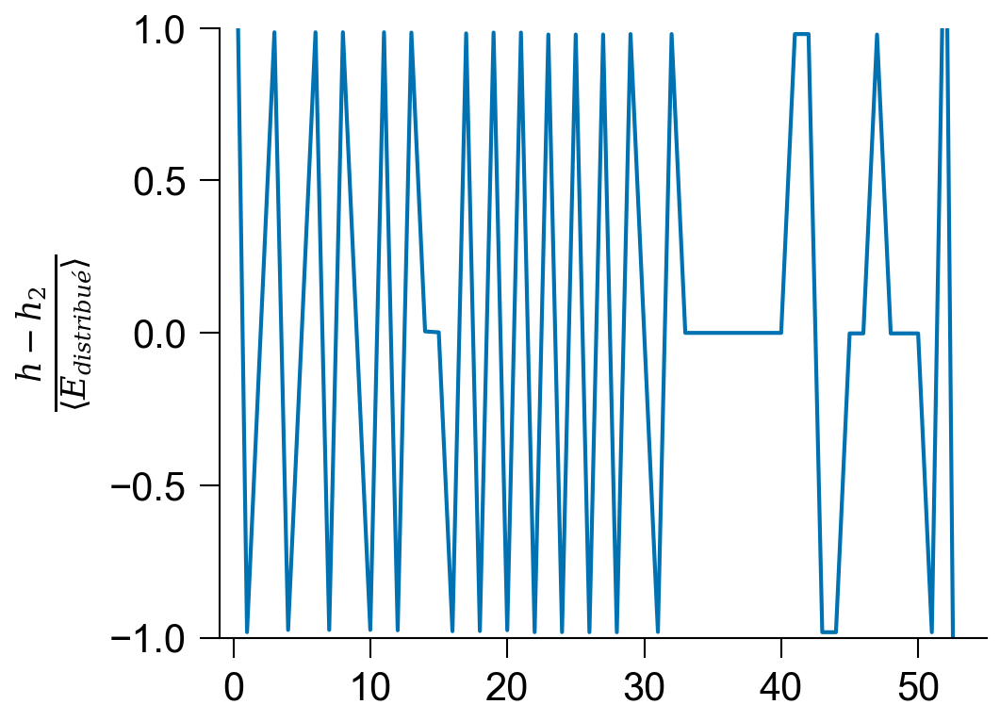

In [78]:
file ="/data1/DATA_Duplat/Brut/Configurations/Co38n7/Snapshots/nav20000000000_outputB.txt"
L1 = 128
L2 = 512
    
with plt.style.context(spstyle.get_style('thesis')):
    # Create figure and subplots at once
    fig, ax2 = plt.subplots(1, 1, figsize=(3.5, 2.8))
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    
    sys = np.loadtxt(file, comments='#').reshape(L2, L1).T
    ax2.plot((1-sys[64, 294:348]- 0.462246)/0.102, c = color_list[0])
    print(1-sys[64, 294:348])
    ax2.set_xlim(-1, 348-294+1)
    ax2.set_ylim(-1, 1)
    ax2.tick_params(length=5, width=1, which='minor')
    ax2.set_ylabel(r"$\frac{h - h_2}{\langle E_{distribué} \rangle}$", fontsize = 12)
    
    cbar = fig.colorbar(pos, ax = ax1, fraction=0.02, aspect = 12, location = 'left', pad = 0.02)
    cbar.set_label(r'$h$', fontsize = 12)
    
    
    plt.show()

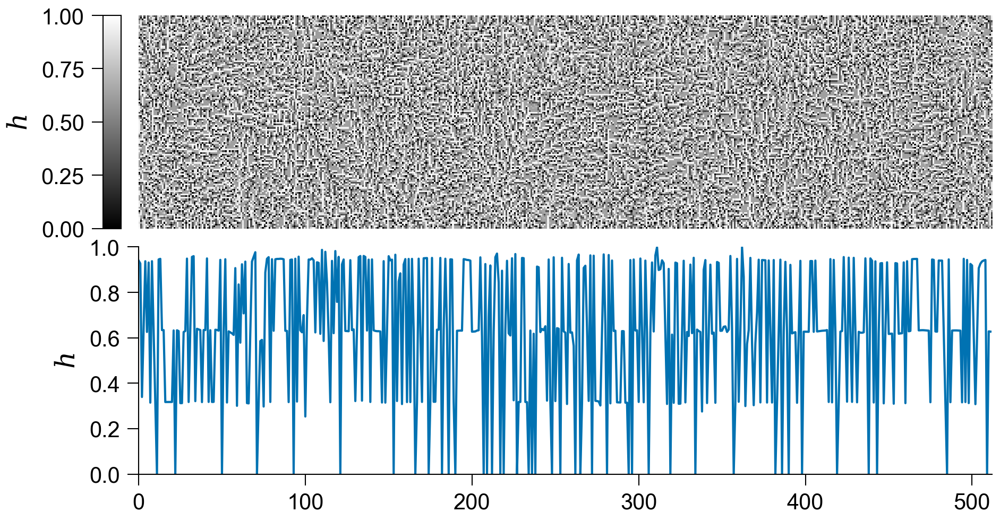

In [ ]:
file ="/data1/DATA_Duplat/Brut/Configurations/Co38n1/Snapshots/nav100000_outputB.txt"
L1 = 128
L2 = 512
    
with plt.style.context(spstyle.get_style('thesis')):
    # Create figure and subplots at once
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7.2, 3.8))
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    
    sys = np.loadtxt(file, comments='#').reshape(L2, L1).T

    pos = ax1.imshow(1-sys, cmap="gray", vmin = 0, vmax = 1)
    ax2.plot(1-sys[64] , c = color_list[0])
    
    ax1.set_axis_off()
    ax2.set_xlim(0, L2)
    ax2.set_ylim(0, 1)
    ax2.tick_params(length=5, width=1, which='minor')
    ax2.set_ylabel(r"$h$", fontsize = 12)
    
    cbar = fig.colorbar(pos, ax = ax1, fraction=0.02, aspect = 12, location = 'left', pad = 0.02)
    cbar.set_label(r'$h$', fontsize = 12)
    
    from matplotlib.cm import ScalarMappable
    import matplotlib.colors as mcolors
    dummy = ScalarMappable(
    norm=mcolors.Normalize(vmin=0, vmax=1),
    cmap="binary"
    )
    dummy.set_array([])

    cbar_dummy = fig.colorbar(dummy, ax=ax2, fraction=0.02, aspect=12, location = 'left', pad = 0.02)
    cbar_dummy.ax.set_visible(False)
    
    plt.show()

[3.17493e-01 6.32257e-01 1.10100e-03 6.33039e-01 6.29453e-01 3.12382e-01
 3.12317e-01 6.25187e-01 6.30052e-01 9.48558e-01 3.17367e-01 6.33187e-01
 9.55978e-01 9.59359e-01 3.21060e-01 6.39522e-01 6.36798e-01 6.33994e-01
 3.16834e-01 6.34050e-01 6.34075e-01 9.49259e-01 3.17648e-01 6.33303e-01
 3.17508e-01 3.17877e-01 6.35416e-01 6.34425e-01 6.31475e-01 9.42969e-01
 1.13000e-04 6.29293e-01 9.45741e-01 3.15094e-01 6.28375e-01 6.24013e-01
 6.19551e-01 6.12636e-01 9.06657e-01 3.00560e-01 8.34760e-01 5.78554e-01
 9.23583e-01 7.07363e-01 9.35256e-01 3.12562e-01 3.11192e-01 6.19815e-01
 9.35928e-01 9.55959e-01]


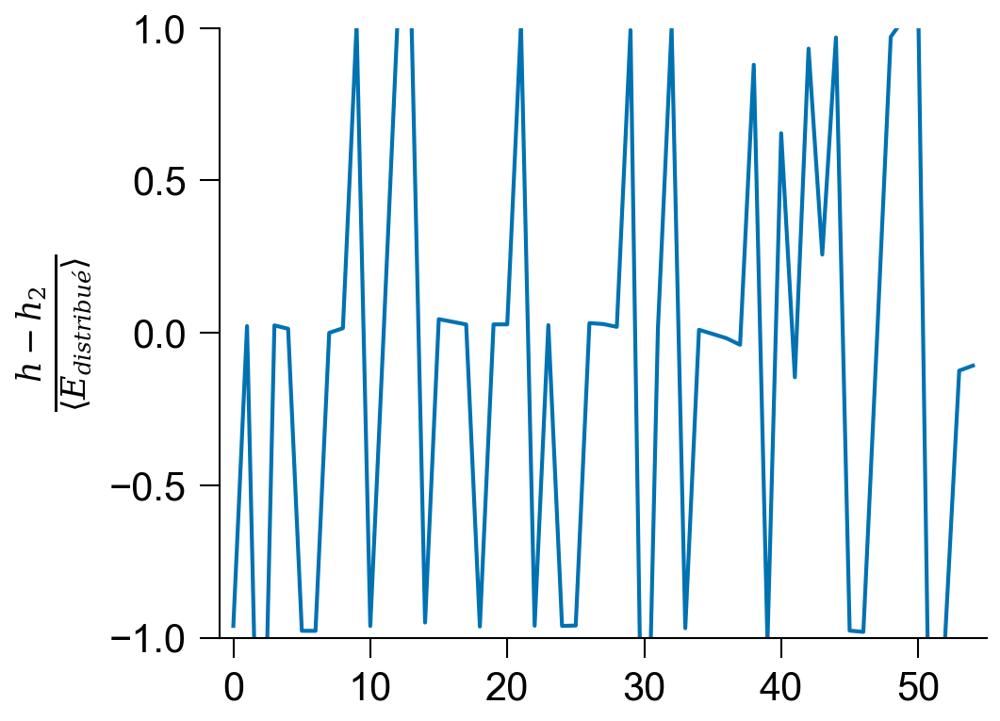

In [90]:
file ="/data1/DATA_Duplat/Brut/Configurations/Co38n1/Snapshots/nav100000_outputB.txt"
L1 = 128
L2 = 512
    
with plt.style.context(spstyle.get_style('thesis')):
    # Create figure and subplots at once
    fig, ax2 = plt.subplots(1, 1, figsize=(3.5, 2.8))
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    
    sys = np.loadtxt(file, comments='#').reshape(L2, L1).T
    ax2.plot((1-sys[64, 20:75]-0.625147)/0.32, c = color_list[0])
    print(1-sys[64, 20:70])
    ax2.set_xlim(-1, 348-294+1)
    ax2.set_ylim(-1, 1)
    ax2.tick_params(length=5, width=1, which='minor')
    ax2.set_ylabel(r"$\frac{h - h_2}{\langle E_{distribué} \rangle}$", fontsize = 12)
    
    cbar = fig.colorbar(pos, ax = ax1, fraction=0.02, aspect = 12, location = 'left', pad = 0.02)
    cbar.set_label(r'$h$', fontsize = 12)
    
    
    plt.show()

#   Prédiction

In [15]:
corr_tree = np.array([-0.019282163905345685,-0.004016990374167351,0.06692541109382386,-0.0044012263274949386,
                      0.44747261695900287,0.7845219846633982,0.7852634605542022,0.6481929534714983,0.6556187874160766
])

corr_rf = np.array([0.0019324772437584303,-0.028299719767903186,0.12486600920901936,0.04665961526403699,
                    0.49630633196674356,0.7914015138548363,0.7929124754913497,0.7936056318111736,0.6970624539720819
])

corr_xgb = np.array([-0.005581900734110359,-0.019575200865059303,0.10053270015948579,0.09569712441475112,
                     0.4825056266527125,0.7719130083416051,0.7904074516198439,0.75734436159961,0.7050453896322667
])

corr_naive = np.array([-0.009815278136236373,0.008371336403575104,0.04763803353542744,0.029710915967644132,
                       0.36050412834203804,0.8001776971862045,0.7660263571997734,0.7915269516689926,0.6822785102121138
])

Tnu = [0,0.02, 0.07,0.1, 0.2,0.3, 0.4, 0.5, 0.6]

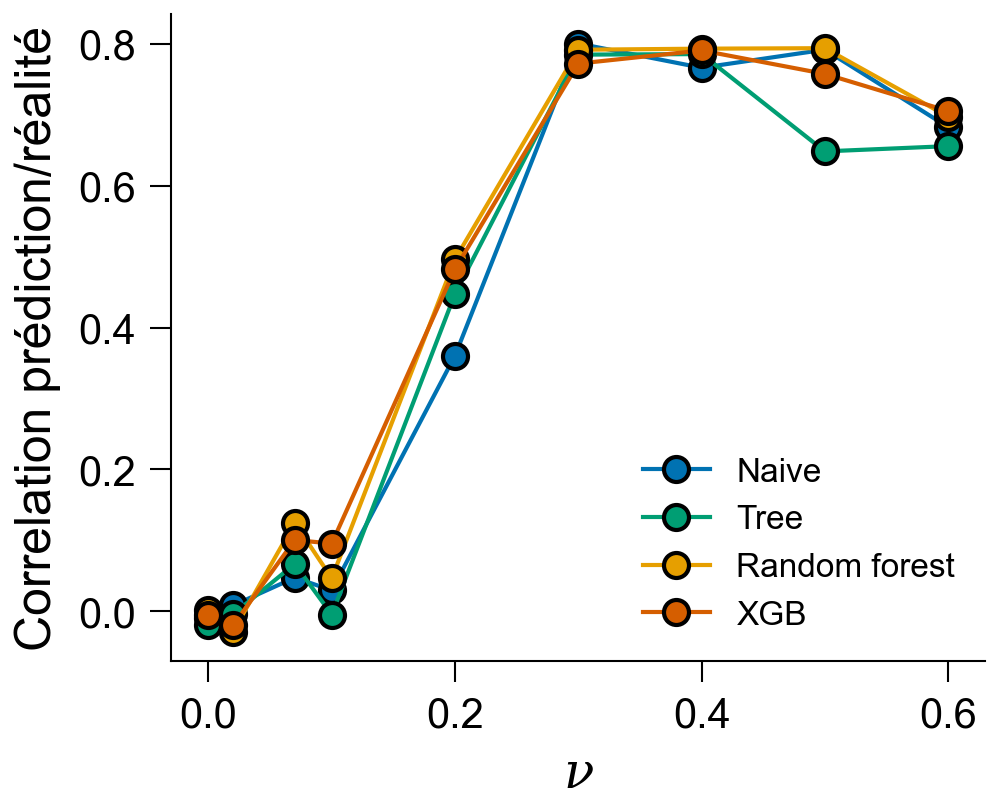

In [23]:
with plt.style.context(spstyle.get_style('thesis')):
    # Create figure and subplots at once
    fig, ax = plt.subplots(1, 1, figsize=(3.5, 2.8))
    
    ax.plot(Tnu, corr_naive, marker = 'o', c = color_list[0], label="Naive")
    ax.plot(Tnu, corr_tree, marker = 'o', c = color_list[1], label="Tree")
    ax.plot(Tnu, corr_rf, marker = 'o', c = color_list[2], label = "Random forest")
    ax.plot(Tnu, corr_xgb, marker = 'o', c = color_list[3], label = "XGB")
    
    ax.set_xlabel(r"$\nu$")
    ax.set_ylabel("Correlation prédiction/réalité")
    
    ax.legend()
    plt.show()